In [1]:
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import warnings
import missingno
warnings.filterwarnings("ignore")
%matplotlib inline
sns.set(style="darkgrid",font_scale=1.5)
pd.set_option("display.max.columns",None)
pd.set_option("display.max.rows",None)

In [3]:
!pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.5 MB/s eta 0:00:00


In [4]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer

In [5]:
libraries = {
    "numpy": "np",
    "pandas": "pd",
    "scipy": "scipy",
    "statsmodels": "statsmodels",
    "matplotlib": "matplotlib",
    "seaborn": "sns",
    "plotly": "plotly",
    "scikit-learn": "sklearn",
    "xgboost": "xgboost",
    "catboost": "catboost",
    "lightgbm": "lightgbm"
}

# Dictionary to store library versions
library_versions = {}

# Check and print versions for each library
for lib in libraries.keys():
    try:
        # Special case for scikit-learn to debug the import explicitly
        if lib == "scikit-learn":
            import sklearn
            library_versions[lib] = sklearn.__version__
        else:
            module = __import__(lib)
            library_versions[lib] = module.__version__
    except ModuleNotFoundError:
        library_versions[lib] = "Not installed"
    except Exception as e:
        library_versions[lib] = f"Error: {str(e)}"

# Display results
for lib, version in library_versions.items():
    if version == "Not installed":
        print(f"{lib}: Not installed. Install using 'pip install {lib}'")
    else:
        print(f"{lib}: {version}")

numpy: 2.0.2
pandas: 2.2.2
scipy: 1.14.1
statsmodels: 0.14.4
matplotlib: 3.10.0
seaborn: 0.13.2
plotly: 5.24.1
scikit-learn: 1.6.1
xgboost: 2.1.4
catboost: 1.2.8
lightgbm: 4.5.0


In [6]:
df = pd.read_csv("/crop_yieldss.csv")


In [7]:
df.head()

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,6637.0,4685,2051.4,631643.29,2057.47,0.710435
2,Castor seed,1997,Kharif,Assam,796.0,22,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,19656.0,126905000,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(lint),1997,Kharif,Assam,1739.0,794,2051.4,165500.63,539.09,0.420909


from matplotlib import pyplot as plt
_df_0['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Area', y='Production', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='Production', y='Fertilizer', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_12.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_13.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
_df_14['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_16['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_17['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_18.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_19['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_19, x='Area', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_20['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_20, x='Area', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_21['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_21, x='Production', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_22['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_22, x='Production', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [8]:
df.tail()

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
19684,Small millets,1998,Kharif,Nagaland,4000.0,2000,1498.0,395200.00,1160.00,0.500000
19685,Wheat,1998,Rabi,Nagaland,1000.0,3000,1498.0,98800.00,290.00,3.000000
19686,Maize,1997,Kharif,Jammu and Kashmir,310883.0,440900,1356.2,29586735.11,96373.73,1.285000
19687,Rice,1997,Kharif,Jammu and Kashmir,275746.0,5488,1356.2,26242746.82,85481.26,0.016667
19688,Wheat,1997,Rabi,Jammu and Kashmir,239344.0,392160,1356.2,22778368.48,74196.64,1.261818


In [9]:
df.sample(5)

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
2746,Tapioca,2008,Whole Year,Tamil Nadu,124301.0,4533359,1201.9,17780015.04,11187.09,35.918333
11646,Moong(Green Gram),2010,Kharif,Madhya Pradesh,83782.0,29404,856.3,13917028.02,20107.68,0.364600
17289,Moong(Green Gram),2019,Rabi,West Bengal,1900.0,1497,1733.4,326344.00,703.00,0.756667
18192,Peas & beans (Pulses),2015,Kharif,Jammu and Kashmir,253.0,1069,1572.6,39951.23,83.49,3.560000
5374,Cowpea(Lobia),2017,Rabi,Tamil Nadu,14233.0,9260,970.9,2240843.52,5408.54,0.608400


In [10]:
df['Crop'] = df['Crop'].str.title()
df['State'] = df['State'].str.title()
df['Season'] = df['Season'].str.title()

In [ ]:
df.shape

(19689, 10)

In [ ]:
df.columns

Index(['Crop', 'Crop_Year', 'Season', 'State', 'Area', 'Production',
       'Annual_Rainfall', 'Fertilizer', 'Pesticide', 'Yield'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19689 entries, 0 to 19688
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Crop             19689 non-null  object 
 1   Crop_Year        19689 non-null  int64  
 2   Season           19689 non-null  object 
 3   State            19689 non-null  object 
 4   Area             19689 non-null  float64
 5   Production       19689 non-null  int64  
 6   Annual_Rainfall  19689 non-null  float64
 7   Fertilizer       19689 non-null  float64
 8   Pesticide        19689 non-null  float64
 9   Yield            19689 non-null  float64
dtypes: float64(5), int64(2), object(3)
memory usage: 1.5+ MB


In [ ]:
pd.options.display.float_format = '{:.2f}'.format
df.describe(include=["int64","float64"]).T

,count,mean,std,min,25%,50%,75%,max
Crop_Year,19689.00,2009.13,6.50,1997.00,2004.00,2010.00,2015.00,2020.00
Area,19689.00,179926.57,732828.68,0.50,1390.00,9317.00,75112.00,50808100.00
Production,19689.00,16435941.27,263056839.81,0.00,1393.00,13804.00,122718.00,6326000000.00
Annual_Rainfall,19689.00,1437.76,816.91,301.30,940.70,1247.60,1643.70,6552.70
Fertilizer,19689.00,24103312.45,94946004.48,54.17,188014.62,1234957.44,10003847.20,4835406877.00
Pesticide,19689.00,48848.35,213287.35,0.09,356.70,2421.90,20041.70,15750511.00
Yield,19689.00,79.95,878.31,0.00,0.60,1.03,2.39,21105.00


In [ ]:
df.describe(include=["object"]).T

,count,unique,top,freq
Crop,19689,55,Rice,1197
Season,19689,6,Kharif,8232
State,19689,30,Karnataka,1432


from matplotlib import pyplot as plt
import seaborn as sns
_df_23.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_24.groupby('unique').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_25.groupby('top').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_26.groupby('freq').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['unique'].value_counts()
    for x_label, grp in _df_27.groupby('index')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('index')
_ = plt.ylabel('unique')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['top'].value_counts()
    for x_label, grp in _df_28.groupby('unique')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('unique')
_ = plt.ylabel('top')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['freq'].value_counts()
    for x_label, grp in _df_29.groupby('top')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('top')
_ = plt.ylabel('freq')

In [ ]:
df.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})

,Total No. of Missing Values
Crop,0
Crop_Year,0
Season,0
State,0
Area,0
Production,0
Annual_Rainfall,0
Fertilizer,0
Pesticide,0
Yield,0


from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Total No. of Missing Values']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Total No. of Missing Values'}, axis=1)
              .sort_values('Total No. of Missing Values', ascending=True))
  xs = counted['Total No. of Missing Values']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_30.sort_values('Total No. of Missing Values', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Total No. of Missing Values')
_ = plt.ylabel('count()')

In [ ]:
print("Duplicate Values =",df.duplicated().sum())

Duplicate Values = 0


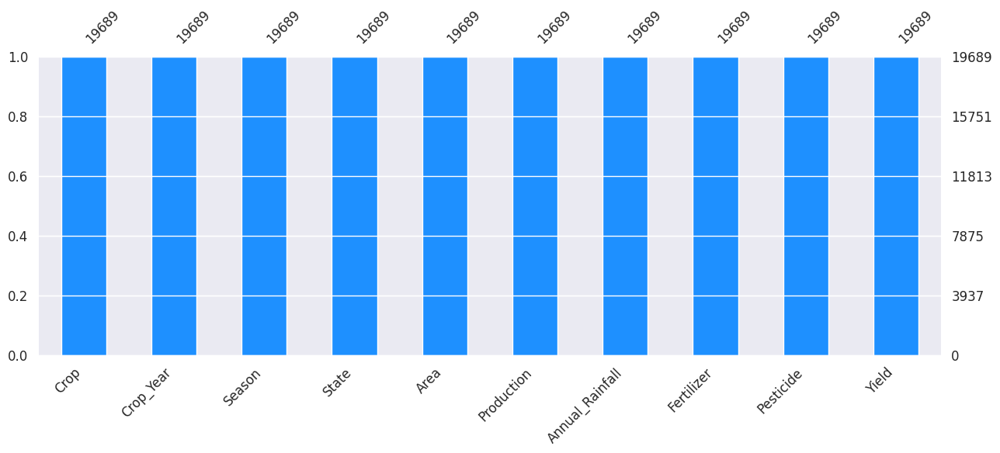

In [ ]:
missingno.bar(df, figsize=(15,5), fontsize=12,color="dodgerblue", sort="ascending");
plt.show()

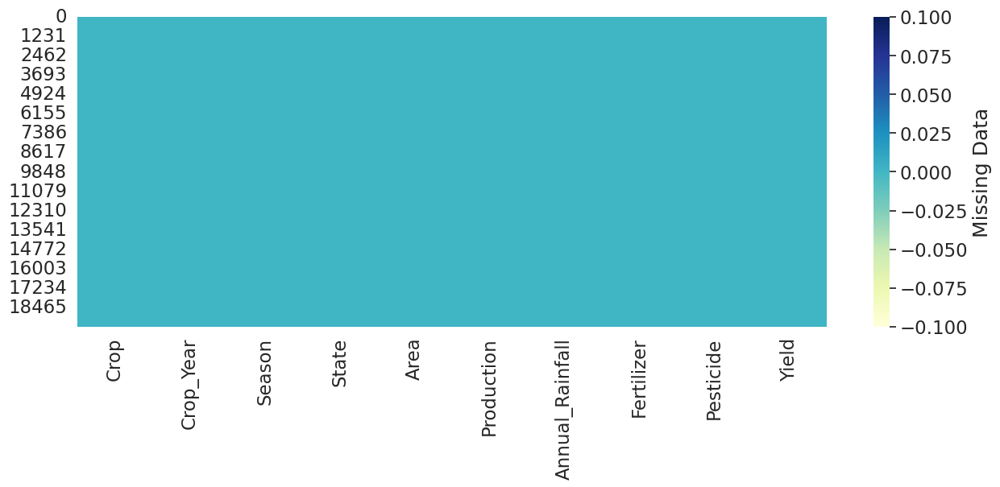

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(),cmap="YlGnBu",cbar_kws={'label': 'Missing Data'});

In [ ]:
numeric_data = df.select_dtypes(include=[np.number])
numeric_data.head()

,Crop_Year,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,1997,73814.00,56708,2051.40,7024878.38,22882.34,0.80
1,1997,6637.00,4685,2051.40,631643.29,2057.47,0.71
2,1997,796.00,22,2051.40,75755.32,246.76,0.24
3,1997,19656.00,126905000,2051.40,1870661.52,6093.36,5238.05
4,1997,1739.00,794,2051.40,165500.63,539.09,0.42


from matplotlib import pyplot as plt
_df_31['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_33['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_34['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_35.plot(kind='scatter', x='index', y='Area', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_36.plot(kind='scatter', x='Area', y='Production', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_37.plot(kind='scatter', x='Production', y='Fertilizer', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_38.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_39.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_40.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Fertilizer']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_41.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Fertilizer')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_42.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
_df_43['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_44['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_45['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_46['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

In [11]:
categorical_data = df.select_dtypes(exclude=[np.number])
categorical_data.head()

,Crop,Season,State
0,Arecanut,Whole Year,Assam
1,Arhar/Tur,Kharif,Assam
2,Castor Seed,Kharif,Assam
3,Coconut,Whole Year,Assam
4,Cotton(Lint),Kharif,Assam


from matplotlib import pyplot as plt
import seaborn as sns
_df_23.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_24.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_25.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

In [ ]:
numeric_data.corr()

,Crop_Year,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
Crop_Year,1.00,-0.04,0.00,-0.01,0.01,-0.00,0.00
Area,-0.04,1.00,0.04,-0.11,0.97,0.97,0.00
Production,0.00,0.04,1.00,0.03,0.04,0.04,0.57
Annual_Rainfall,-0.01,-0.11,0.03,1.00,-0.11,-0.10,0.02
Fertilizer,0.01,0.97,0.04,-0.11,1.00,0.95,0.00
Pesticide,-0.00,0.97,0.04,-0.10,0.95,1.00,0.00
Yield,0.00,0.00,0.57,0.02,0.00,0.00,1.00


from matplotlib import pyplot as plt
_df_56['Crop_Year'].plot(kind='hist', bins=20, title='Crop_Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_57['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_58['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_59['Annual_Rainfall'].plot(kind='hist', bins=20, title='Annual_Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_60.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_61.plot(kind='scatter', x='Crop_Year', y='Area', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_62.plot(kind='scatter', x='Area', y='Production', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_63.plot(kind='scatter', x='Production', y='Annual_Rainfall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_64.plot(kind='scatter', x='Annual_Rainfall', y='Fertilizer', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_65['Crop_Year'].plot(kind='line', figsize=(8, 4), title='Crop_Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_66['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_67['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_68['Annual_Rainfall'].plot(kind='line', figsize=(8, 4), title='Annual_Rainfall')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_69['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_69, x='Crop_Year', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_70['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_70, x='Area', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_71['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_71, x='Production', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_72['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_72, x='Annual_Rainfall', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
fig = px.imshow(numeric_data.corr(),text_auto=True,aspect="auto")
fig.show()

In [ ]:
df['Crop_Year'].value_counts(ascending=False)

,count
Crop_Year,
2019,1079
2017,1070
2018,1063
2016,1036
2015,998
2013,976
2014,965
2011,907
2012,894


In [ ]:
df = df[df['Crop_Year'] != 2020]

In [ ]:
df['Crop'].value_counts(ascending=False)

,count
Crop,
Rice,1195
Maize,973
Moong(Green Gram),738
Urad,731
Groundnut,724
Sesamum,684
Potato,626
Sugarcane,604
Wheat,544


In [ ]:
df['Crop'].value_counts(ascending=False)

,count
Crop,
Rice,1195
Maize,973
Moong(Green Gram),738
Urad,731
Groundnut,724
Sesamum,684
Potato,626
Sugarcane,604
Wheat,544


In [ ]:
df['Season'].value_counts(ascending=False)

,count
Season,
Kharif,8215
Rabi,5732
Whole Year,3712
Summer,1190
Autumn,414
Winter,389


In [ ]:
df['State'].value_counts(ascending=False)

,count
State,
Karnataka,1432
Andhra Pradesh,1266
West Bengal,1094
Chhattisgarh,915
Bihar,896
Madhya Pradesh,845
Uttar Pradesh,825
Tamil Nadu,822
Gujarat,817


In [ ]:
df_state_sort = df.groupby('State',as_index=False)['Yield'].sum().sort_values(by='Yield', ascending=False)
df_state_sort

,State,Yield
29,West Bengal,291986.75
21,Puducherry,232163.60
0,Andhra Pradesh,229735.18
24,Tamil Nadu,185813.28
2,Assam,160612.65
12,Karnataka,151391.87
13,Kerala,147710.35
6,Goa,87275.96
25,Telangana,39508.73
7,Gujarat,5471.63


from matplotlib import pyplot as plt
_df_73['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_74['Yield'].plot(kind='hist', bins=20, title='Yield')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_75.plot(kind='scatter', x='index', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_76['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_77['Yield'].plot(kind='line', figsize=(8, 4), title='Yield')
plt.gca().spines[['top', 'right']].set_visible(False)

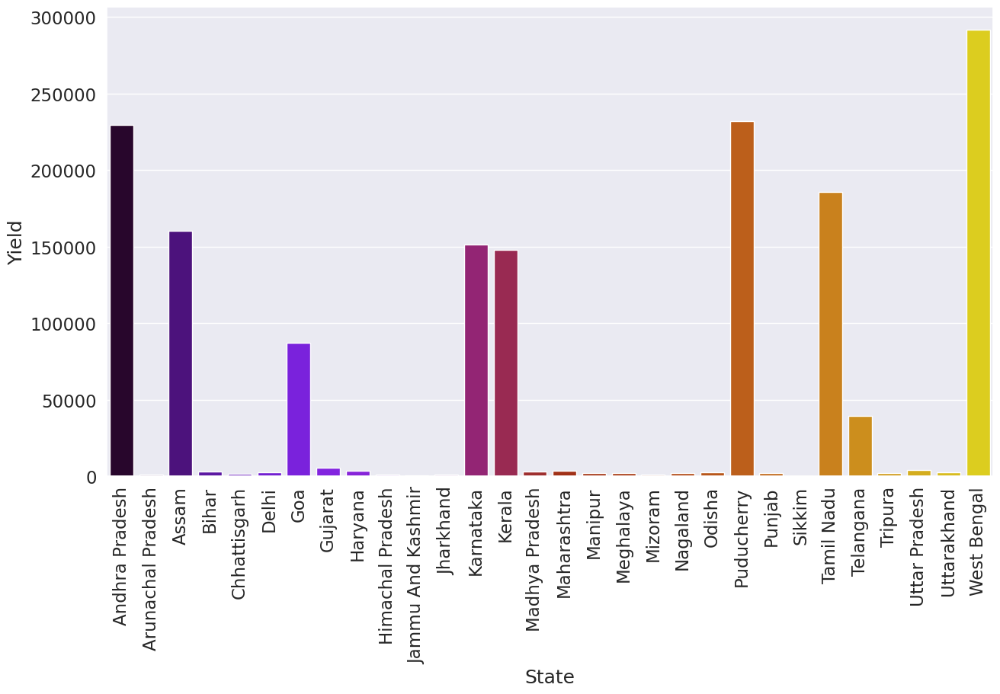

In [ ]:
df_state = df.groupby('State',as_index=False)['Yield'].sum()
plt.figure(figsize = (15,8))
sns.barplot(x = df_state['State'], y=df_state['Yield'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

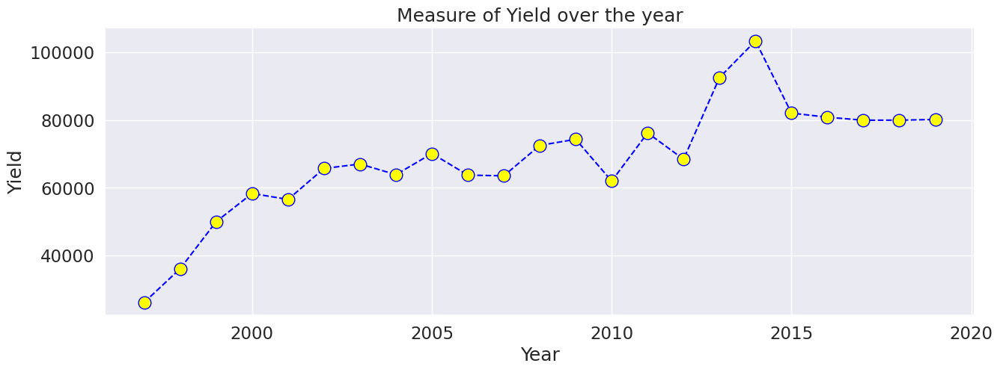

In [ ]:
df_state = df.groupby('Crop_Year',as_index=False)['Yield'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Yield'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Yield')
plt.title('Measure of Yield over the year')
plt.show()

In [ ]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Yield
29,West Bengal,291986.75
21,Puducherry,232163.60
0,Andhra Pradesh,229735.18
24,Tamil Nadu,185813.28
2,Assam,160612.65
12,Karnataka,151391.87
13,Kerala,147710.35
6,Goa,87275.96
25,Telangana,39508.73
7,Gujarat,5471.63


from matplotlib import pyplot as plt
_df_78['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_79['Yield'].plot(kind='hist', bins=20, title='Yield')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_80.plot(kind='scatter', x='index', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_81['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_82['Yield'].plot(kind='line', figsize=(8, 4), title='Yield')
plt.gca().spines[['top', 'right']].set_visible(False)

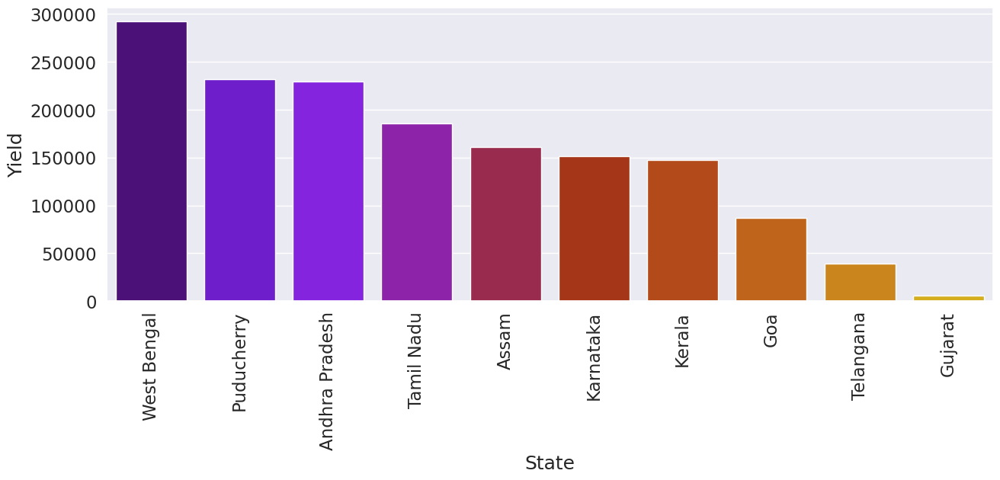

In [ ]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Yield'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [ ]:
df_state_sort = df.groupby('State',as_index=False)['Annual_Rainfall'].sum().sort_values(by='Annual_Rainfall', ascending=False)
df_state_sort

,State,Annual_Rainfall
17,Meghalaya,2623959.14
29,West Bengal,1883455.70
12,Karnataka,1692392.73
13,Kerala,1536641.30
2,Assam,1531493.36
0,Andhra Pradesh,1160139.90
4,Chhattisgarh,1159347.20
20,Odisha,1098412.40
19,Nagaland,1064884.45
3,Bihar,1042239.50


from matplotlib import pyplot as plt
_df_83['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_84['Annual_Rainfall'].plot(kind='hist', bins=20, title='Annual_Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_85.plot(kind='scatter', x='index', y='Annual_Rainfall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_86['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_87['Annual_Rainfall'].plot(kind='line', figsize=(8, 4), title='Annual_Rainfall')
plt.gca().spines[['top', 'right']].set_visible(False)

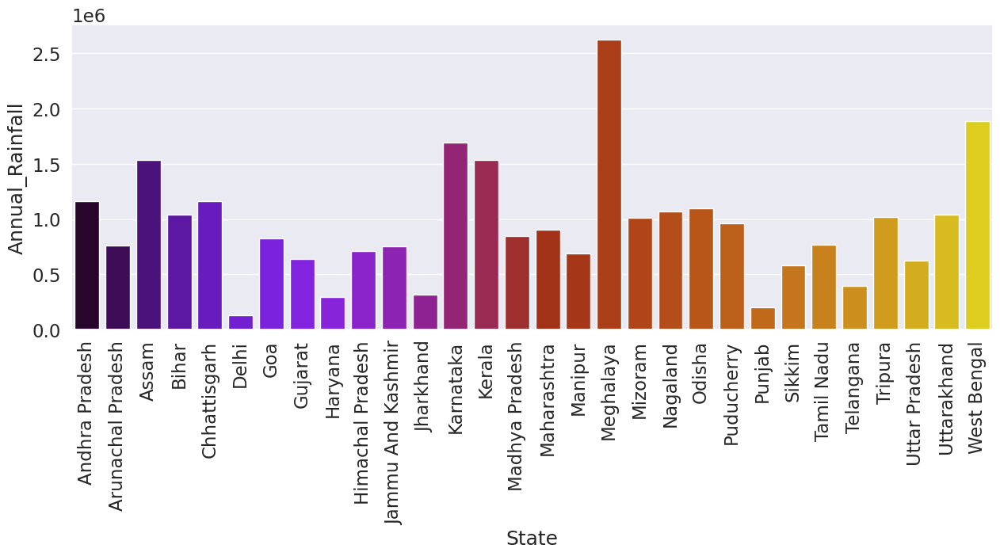

In [ ]:
df_state = df.groupby('State',as_index=False)['Annual_Rainfall'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Annual_Rainfall'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

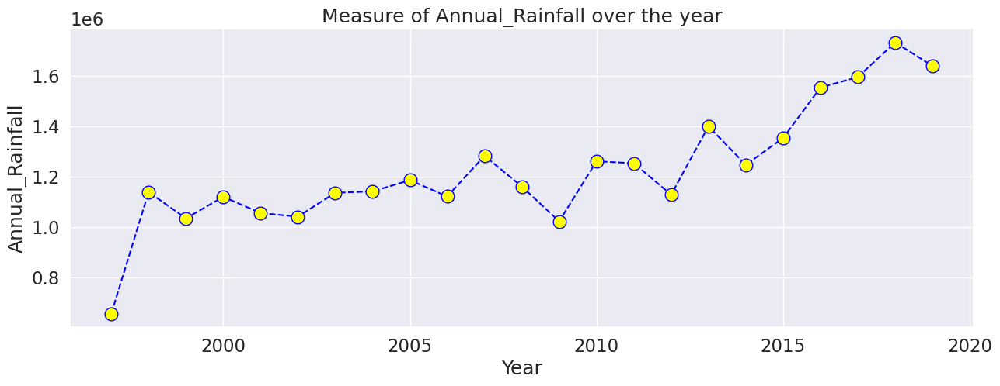

In [ ]:
df_state = df.groupby('Crop_Year',as_index=False)['Annual_Rainfall'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Annual_Rainfall'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Annual_Rainfall')
plt.title('Measure of Annual_Rainfall over the year')
plt.show()

In [ ]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Annual_Rainfall
17,Meghalaya,2623959.14
29,West Bengal,1883455.70
12,Karnataka,1692392.73
13,Kerala,1536641.30
2,Assam,1531493.36
0,Andhra Pradesh,1160139.90
4,Chhattisgarh,1159347.20
20,Odisha,1098412.40
19,Nagaland,1064884.45
3,Bihar,1042239.50


from matplotlib import pyplot as plt
_df_88['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_89['Annual_Rainfall'].plot(kind='hist', bins=20, title='Annual_Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_90.plot(kind='scatter', x='index', y='Annual_Rainfall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_91['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_92['Annual_Rainfall'].plot(kind='line', figsize=(8, 4), title='Annual_Rainfall')
plt.gca().spines[['top', 'right']].set_visible(False)

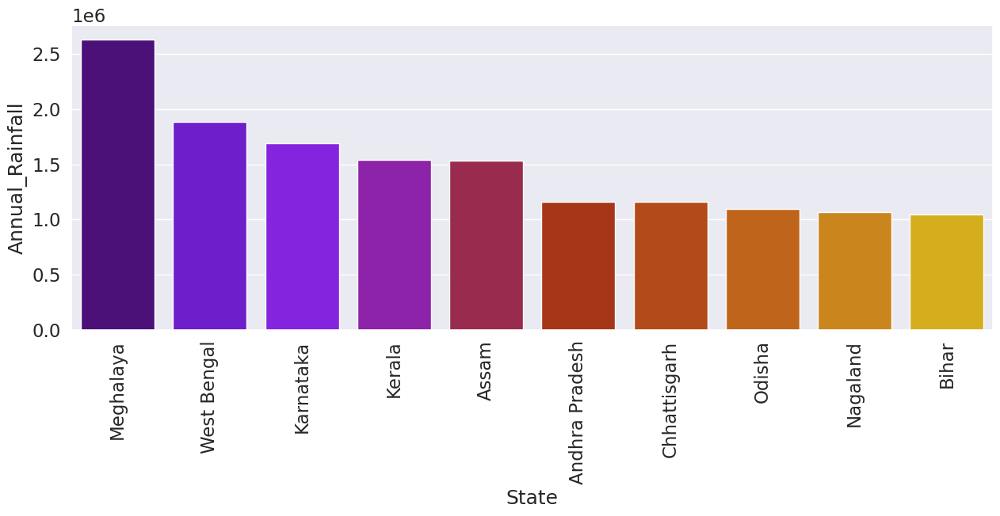

In [ ]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Annual_Rainfall'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [ ]:
df_state_sort = df.groupby('State',as_index=False)['Area'].sum().sort_values(by='Area', ascending=False)
df_state_sort

,State,Area
27,Uttar Pradesh,542672635.00
14,Madhya Pradesh,492087994.46
15,Maharashtra,461939552.15
12,Karnataka,257907399.00
0,Andhra Pradesh,238925335.00
29,West Bengal,237682264.87
7,Gujarat,222434333.20
3,Bihar,167995431.00
22,Punjab,162040200.00
8,Haryana,131506993.60


from matplotlib import pyplot as plt
_df_93['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_94['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_95.plot(kind='scatter', x='index', y='Area', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_96['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_97['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

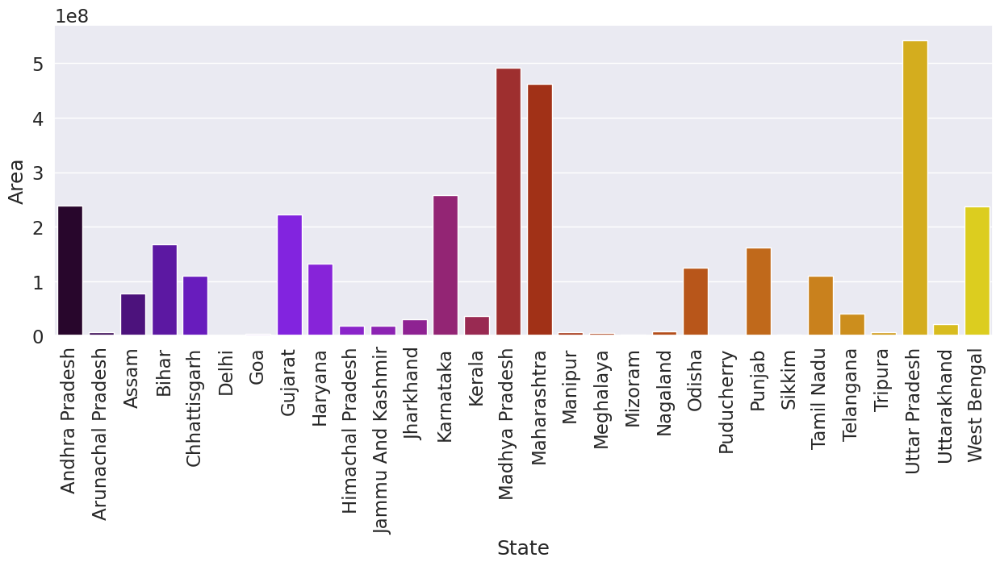

In [ ]:
df_state = df.groupby('State',as_index=False)['Area'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Area'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

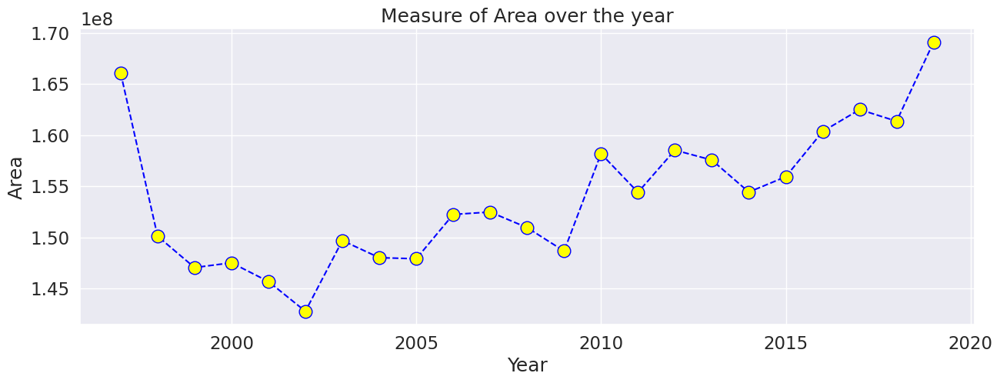

In [ ]:
df_state = df.groupby('Crop_Year',as_index=False)['Area'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Area'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Area')
plt.title('Measure of Area over the year')
plt.show()

In [ ]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Area
27,Uttar Pradesh,542672635.00
14,Madhya Pradesh,492087994.46
15,Maharashtra,461939552.15
12,Karnataka,257907399.00
0,Andhra Pradesh,238925335.00
29,West Bengal,237682264.87
7,Gujarat,222434333.20
3,Bihar,167995431.00
22,Punjab,162040200.00
8,Haryana,131506993.60


from matplotlib import pyplot as plt
_df_98['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_99['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_100.plot(kind='scatter', x='index', y='Area', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_101['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_102['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

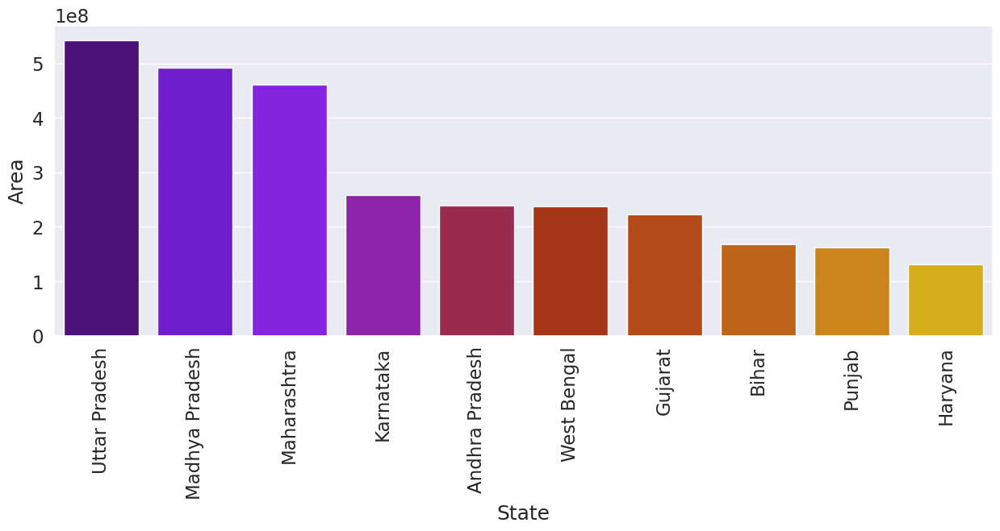

In [ ]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Area'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [ ]:
df_state_sort = df.groupby('State',as_index=False)['Annual_Rainfall'].sum().sort_values(by='Annual_Rainfall', ascending=False)
df_state_sort

,State,Annual_Rainfall
17,Meghalaya,2623959.14
29,West Bengal,1883455.70
12,Karnataka,1692392.73
13,Kerala,1536641.30
2,Assam,1531493.36
0,Andhra Pradesh,1160139.90
4,Chhattisgarh,1159347.20
20,Odisha,1098412.40
19,Nagaland,1064884.45
3,Bihar,1042239.50


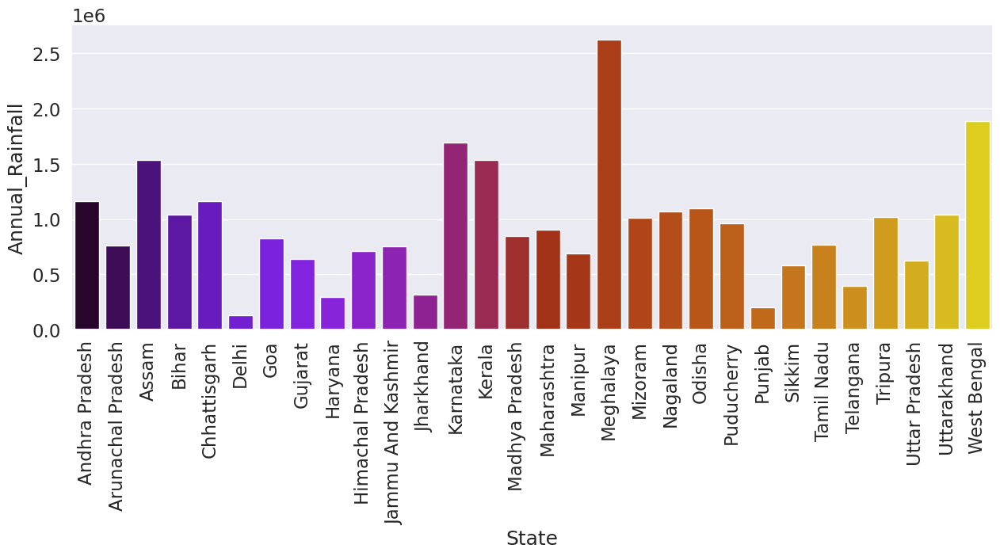

In [ ]:
df_state = df.groupby('State',as_index=False)['Annual_Rainfall'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Annual_Rainfall'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

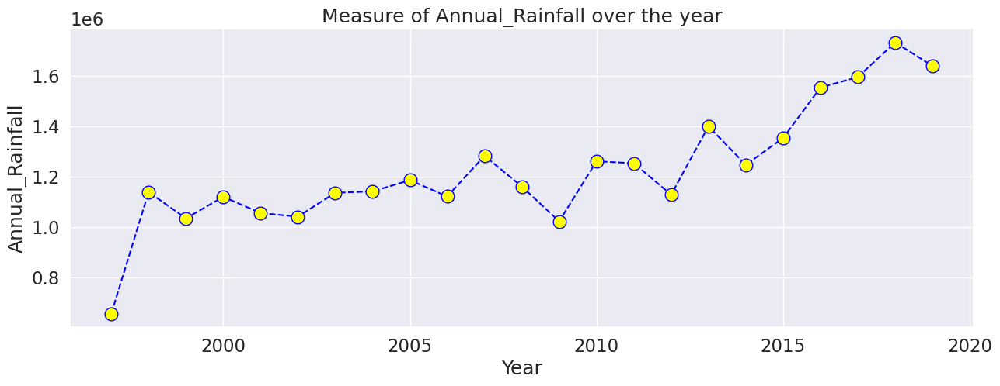

In [ ]:
df_state = df.groupby('Crop_Year',as_index=False)['Annual_Rainfall'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Annual_Rainfall'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Annual_Rainfall')
plt.title('Measure of Annual_Rainfall over the year')
plt.show()

In [ ]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Annual_Rainfall
17,Meghalaya,2623959.14
29,West Bengal,1883455.70
12,Karnataka,1692392.73
13,Kerala,1536641.30
2,Assam,1531493.36
0,Andhra Pradesh,1160139.90
4,Chhattisgarh,1159347.20
20,Odisha,1098412.40
19,Nagaland,1064884.45
3,Bihar,1042239.50


from matplotlib import pyplot as plt
_df_103['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_104['Annual_Rainfall'].plot(kind='hist', bins=20, title='Annual_Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_105.plot(kind='scatter', x='index', y='Annual_Rainfall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_106['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_107['Annual_Rainfall'].plot(kind='line', figsize=(8, 4), title='Annual_Rainfall')
plt.gca().spines[['top', 'right']].set_visible(False)

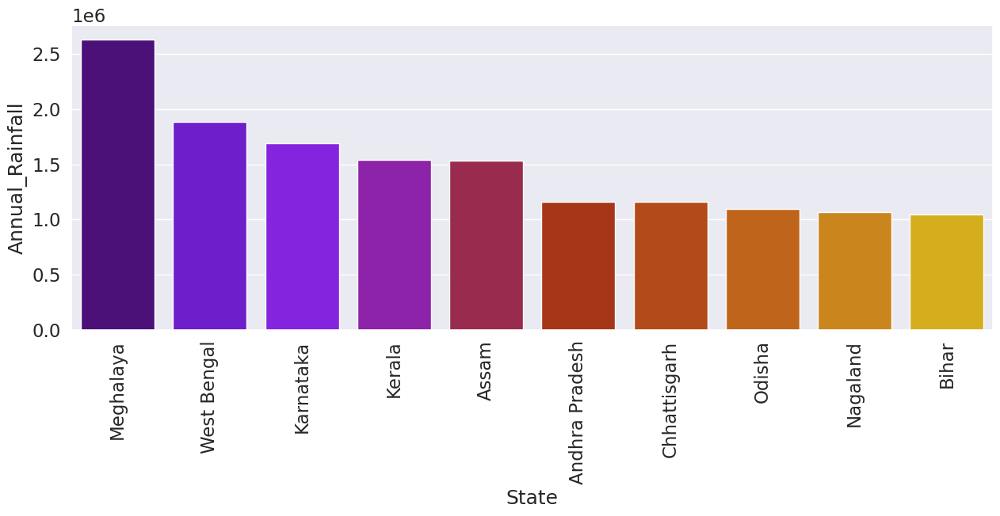

In [ ]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Annual_Rainfall'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [16]:
df_state_sort = df.groupby('State',as_index=False)['Area'].sum().sort_values(by='Area', ascending=False)
df_state_sort

,State,Area
27,Uttar Pradesh,5.426726e+08
14,Madhya Pradesh,4.920880e+08
15,Maharashtra,4.619396e+08
12,Karnataka,2.579074e+08
0,Andhra Pradesh,2.389253e+08
29,West Bengal,2.376823e+08
7,Gujarat,2.224343e+08
3,Bihar,1.679954e+08
22,Punjab,1.620402e+08
8,Haryana,1.315070e+08


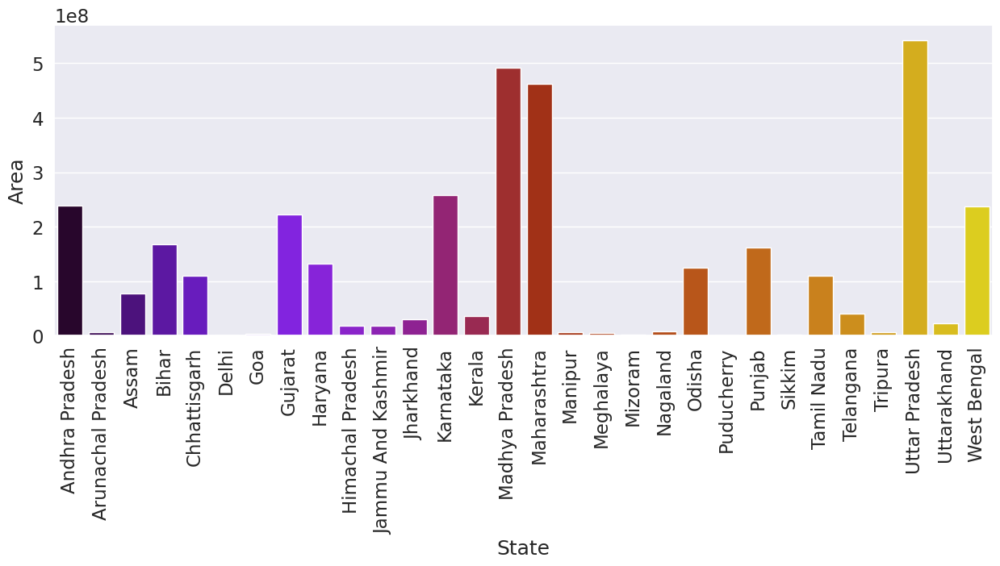

In [17]:
df_state = df.groupby('State',as_index=False)['Area'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Area'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

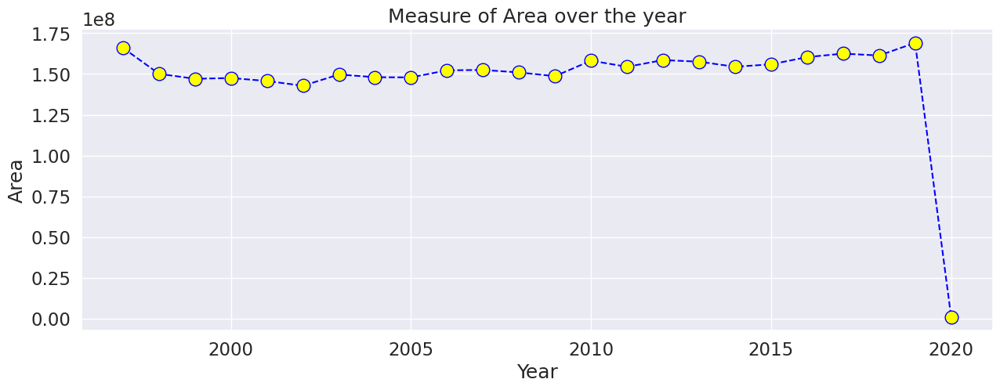

In [18]:
df_state = df.groupby('Crop_Year',as_index=False)['Area'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Area'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Area')
plt.title('Measure of Area over the year')
plt.show()

In [20]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Area
27,Uttar Pradesh,5.426726e+08
14,Madhya Pradesh,4.920880e+08
15,Maharashtra,4.619396e+08
12,Karnataka,2.579074e+08
0,Andhra Pradesh,2.389253e+08
29,West Bengal,2.376823e+08
7,Gujarat,2.224343e+08
3,Bihar,1.679954e+08
22,Punjab,1.620402e+08
8,Haryana,1.315070e+08


from matplotlib import pyplot as plt
top_10_states['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
top_10_states['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

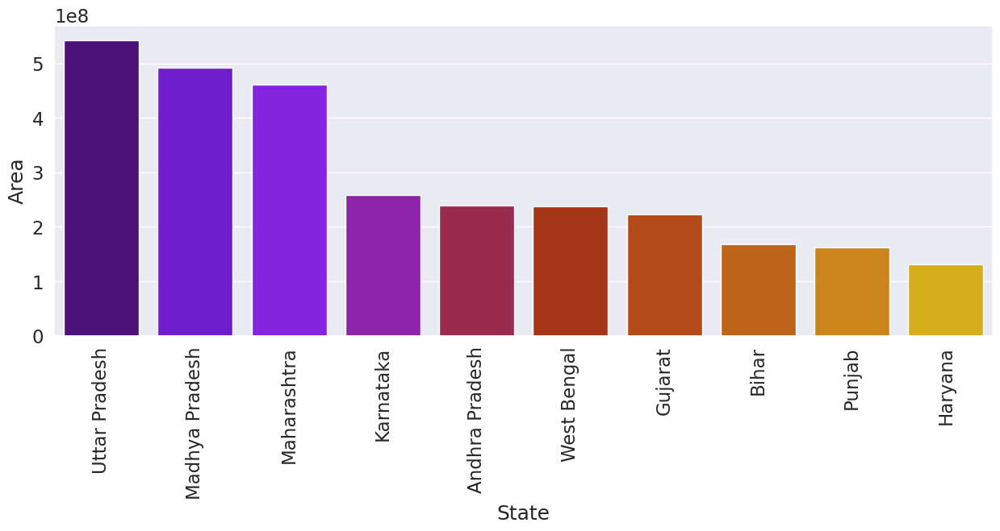

In [21]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Area'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [22]:
df_state_sort = df.groupby('State',as_index=False)['Production'].sum().sort_values(by='Production', ascending=False)
df_state_sort

,State,Production
13,Kerala,129700649853
24,Tamil Nadu,78051759253
12,Karnataka,63772797366
0,Andhra Pradesh,26076218605
29,West Bengal,8941179120
27,Uttar Pradesh,4442585302
2,Assam,3637714928
6,Goa,2193998349
15,Maharashtra,1878564915
14,Madhya Pradesh,834490323


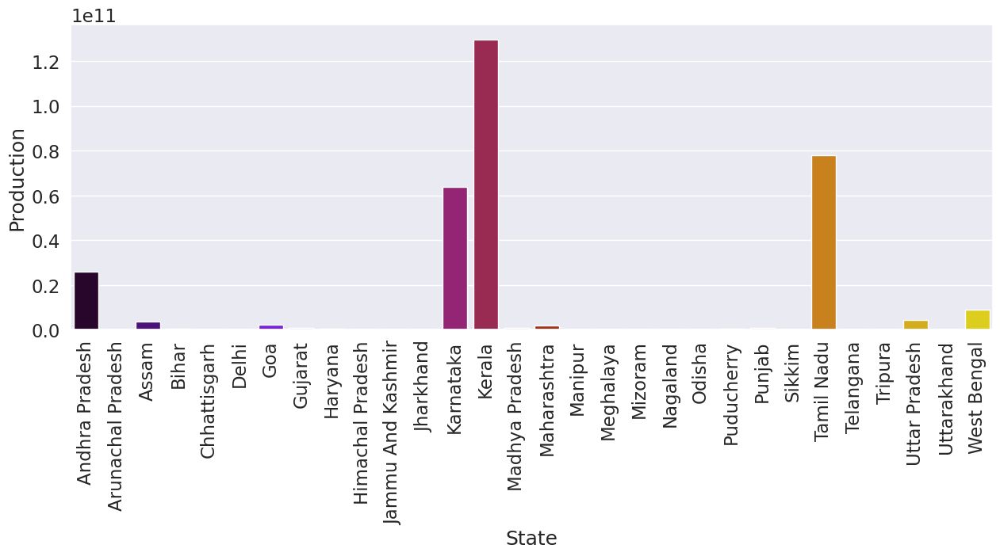

In [23]:
df_state = df.groupby('State',as_index=False)['Production'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Production'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

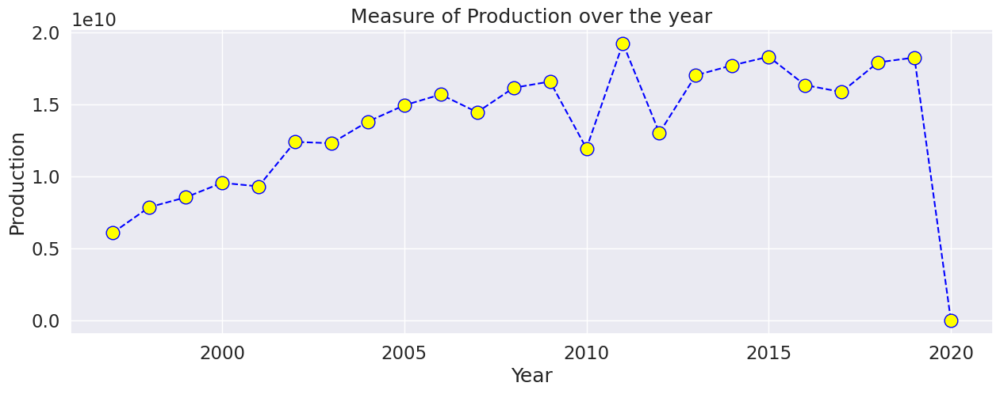

In [24]:
df_state = df.groupby('Crop_Year',as_index=False)['Production'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Production'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Production')
plt.title('Measure of Production over the year')
plt.show()

In [25]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Production
13,Kerala,129700649853
24,Tamil Nadu,78051759253
12,Karnataka,63772797366
0,Andhra Pradesh,26076218605
29,West Bengal,8941179120
27,Uttar Pradesh,4442585302
2,Assam,3637714928
6,Goa,2193998349
15,Maharashtra,1878564915
14,Madhya Pradesh,834490323


from matplotlib import pyplot as plt
top_10_states['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
top_10_states['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

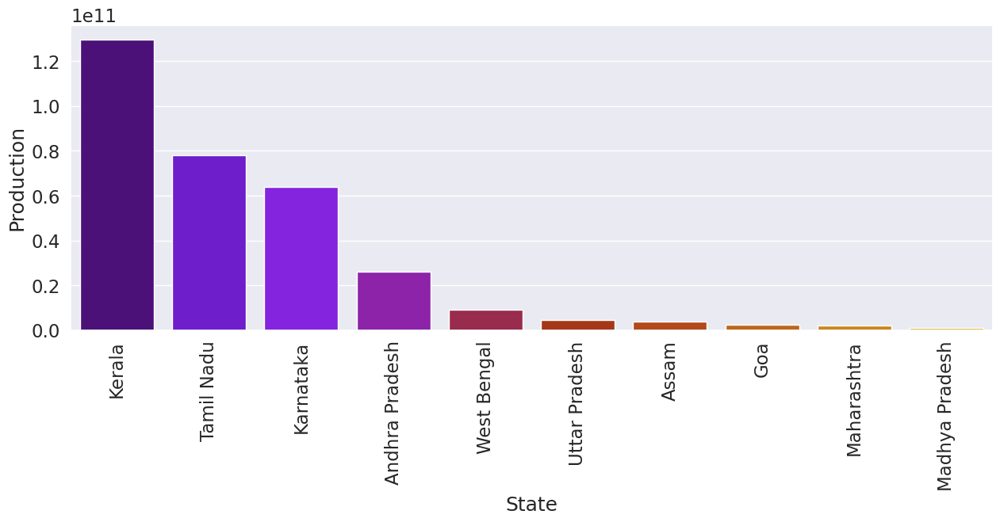

In [26]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Production'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [27]:
df_state_sort = df.groupby('State',as_index=False)['Fertilizer'].sum().sort_values(by='Fertilizer', ascending=False)
df_state_sort

,State,Fertilizer
27,Uttar Pradesh,7.245282e+10
14,Madhya Pradesh,6.708800e+10
15,Maharashtra,6.238907e+10
12,Karnataka,3.458024e+10
0,Andhra Pradesh,3.125890e+10
7,Gujarat,2.993028e+10
29,West Bengal,2.970480e+10
3,Bihar,2.220212e+10
22,Punjab,2.165230e+10
8,Haryana,1.764513e+10


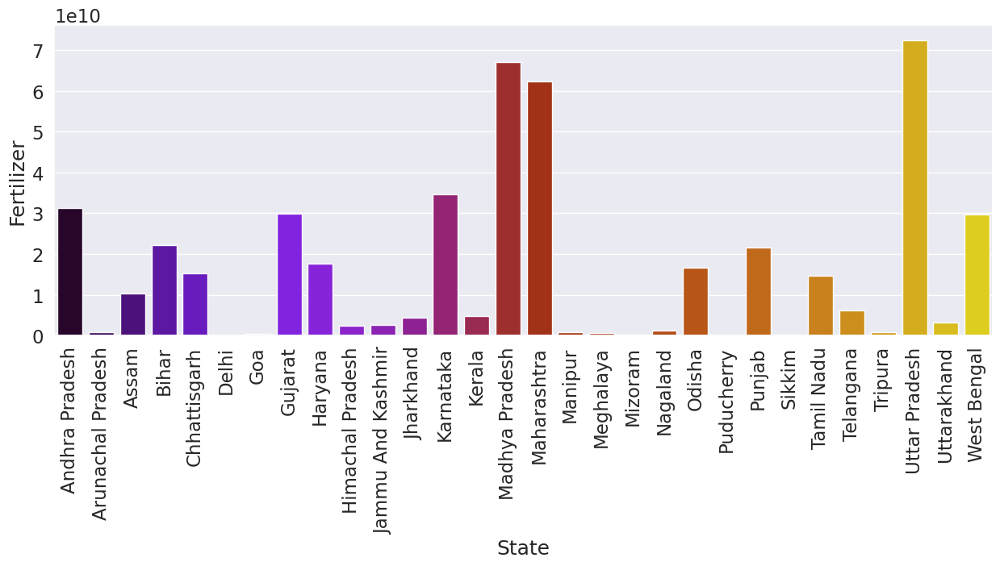

In [28]:
df_state = df.groupby('State',as_index=False)['Fertilizer'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Fertilizer'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

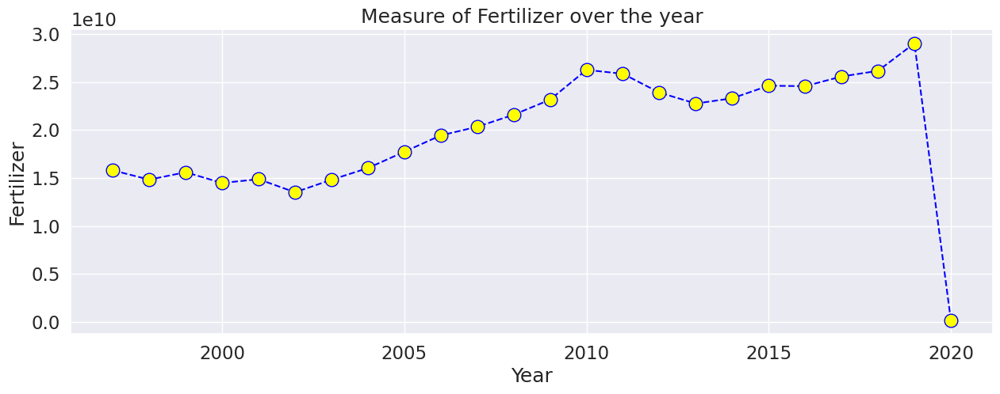

In [29]:
df_state = df.groupby('Crop_Year',as_index=False)['Fertilizer'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Fertilizer'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Fertilizer')
plt.title('Measure of Fertilizer over the year')
plt.show()

In [30]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Fertilizer
27,Uttar Pradesh,7.245282e+10
14,Madhya Pradesh,6.708800e+10
15,Maharashtra,6.238907e+10
12,Karnataka,3.458024e+10
0,Andhra Pradesh,3.125890e+10
7,Gujarat,2.993028e+10
29,West Bengal,2.970480e+10
3,Bihar,2.220212e+10
22,Punjab,2.165230e+10
8,Haryana,1.764513e+10


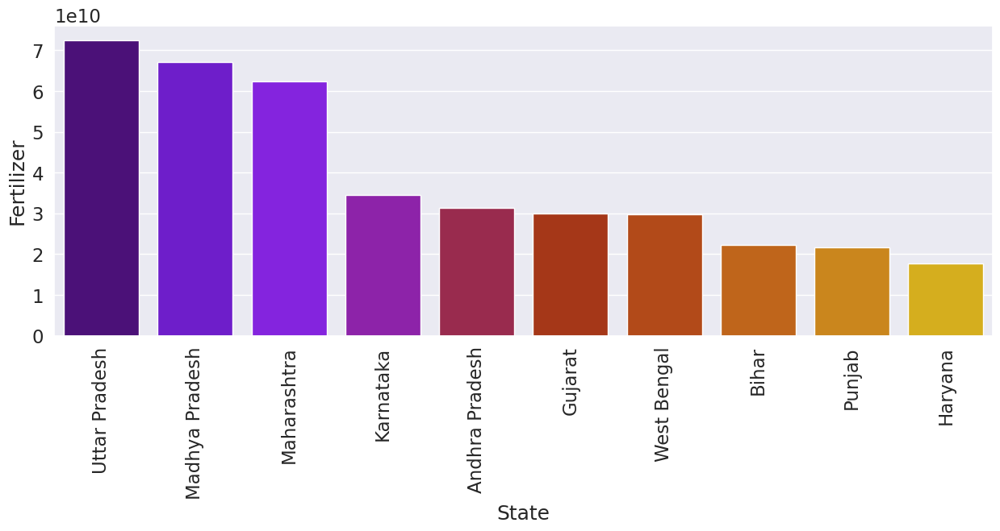

In [31]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Fertilizer'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [32]:
df_state_sort = df.groupby('State',as_index=False)['Pesticide'].sum().sort_values(by='Pesticide', ascending=False)
df_state_sort

,State,Pesticide
27,Uttar Pradesh,1.471335e+08
14,Madhya Pradesh,1.359908e+08
15,Maharashtra,1.246885e+08
12,Karnataka,6.917312e+07
29,West Bengal,6.612665e+07
0,Andhra Pradesh,6.210724e+07
7,Gujarat,6.006711e+07
3,Bihar,4.531080e+07
22,Punjab,4.375276e+07
8,Haryana,3.571026e+07


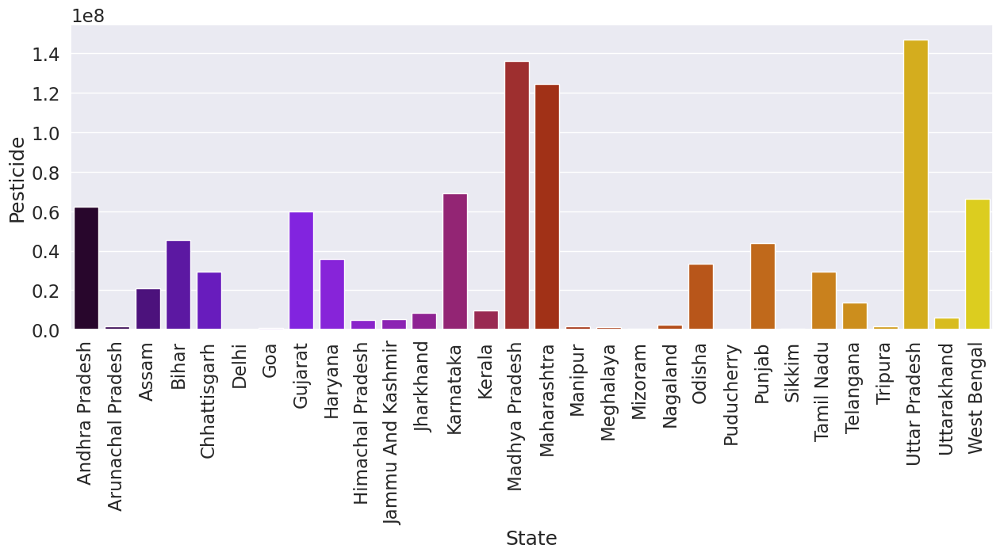

In [33]:
df_state = df.groupby('State',as_index=False)['Pesticide'].sum()
plt.figure(figsize = (15,5))
sns.barplot(x = df_state['State'], y=df_state['Pesticide'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

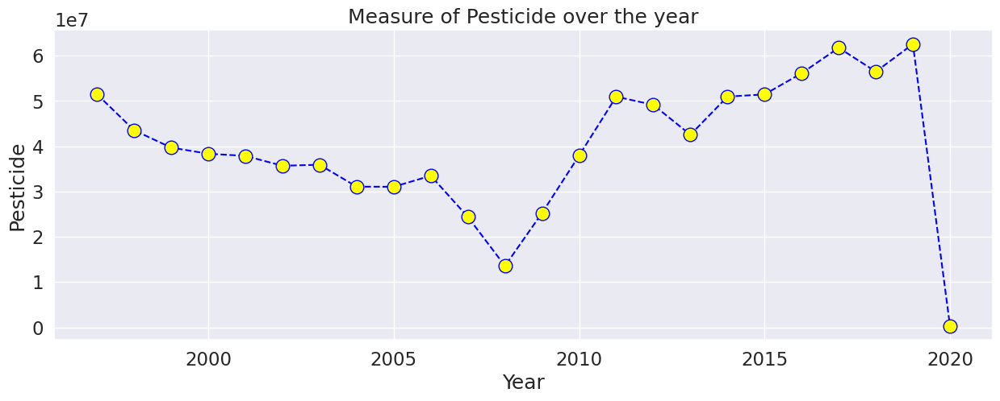

In [34]:
df_state = df.groupby('Crop_Year',as_index=False)['Pesticide'].sum()
plt.figure(figsize = (15,5))
plt.plot(df_state['Crop_Year'], df_state['Pesticide'],color='blue', linestyle='dashed', marker='o',markersize=12, markerfacecolor='yellow')
plt.xlabel('Year')
plt.ylabel('Pesticide')
plt.title('Measure of Pesticide over the year')
plt.show()

In [35]:
top_10_states = df_state_sort.head(10)
top_10_states

,State,Pesticide
27,Uttar Pradesh,1.471335e+08
14,Madhya Pradesh,1.359908e+08
15,Maharashtra,1.246885e+08
12,Karnataka,6.917312e+07
29,West Bengal,6.612665e+07
0,Andhra Pradesh,6.210724e+07
7,Gujarat,6.006711e+07
3,Bihar,4.531080e+07
22,Punjab,4.375276e+07
8,Haryana,3.571026e+07


from matplotlib import pyplot as plt
top_10_states['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
top_10_states['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

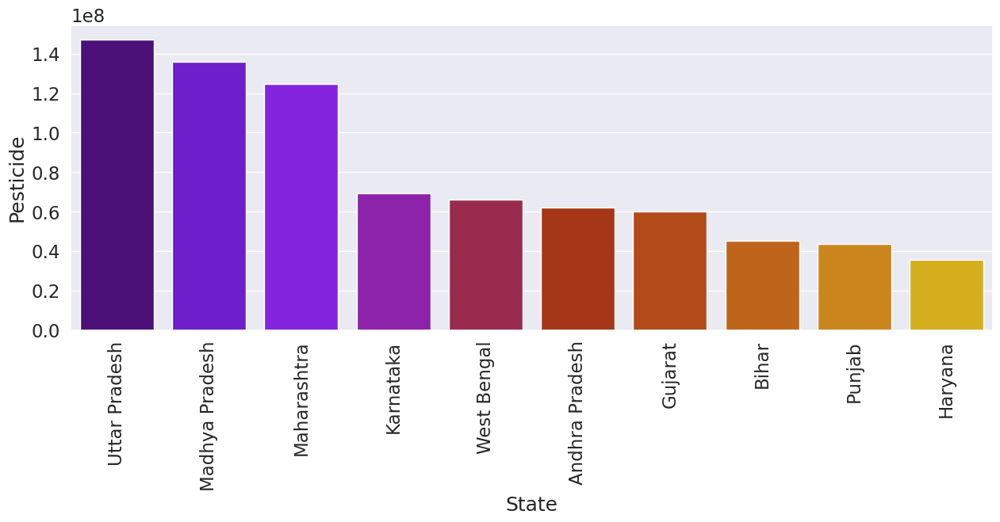

In [36]:
plt.figure(figsize = (15,5))
sns.barplot(x = top_10_states['State'], y=top_10_states['Pesticide'], palette = 'gnuplot')
plt.xticks(rotation = 90)
plt.show()

In [37]:
df_without_eda = df.copy()

In [38]:
df_without_eda.head()

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,6637.0,4685,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,796.0,22,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,19656.0,126905000,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,1739.0,794,2051.4,165500.63,539.09,0.420909


from matplotlib import pyplot as plt
_df_26['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_28['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_30.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_31.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32.plot(kind='scatter', x='Area', y='Production', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_33.plot(kind='scatter', x='Production', y='Fertilizer', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_34.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_35.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_36.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_37.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_38.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_39.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
_df_40['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_41['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_42['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_43['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_44.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_45['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_45, x='Area', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_46['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_46, x='Area', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_47['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_47, x='Production', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_48['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_48, x='Production', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [39]:
# Drop 'Area' and 'Production' columns
df_without_eda = df_without_eda.drop(['Area', 'Production'], axis=1)

In [40]:
df_without_eda.head()

,Crop,Crop_Year,Season,State,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,2051.4,165500.63,539.09,0.420909


In [41]:
category_columns = df_without_eda.select_dtypes(include = ['object']).columns
category_columns

Index(['Crop', 'Season', 'State'], dtype='object')

In [42]:
df_without_eda.shape

(19689, 8)

In [43]:
df_without_eda.head()

,Crop,Crop_Year,Season,State,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,2051.4,165500.63,539.09,0.420909


In [44]:
boolean_cols_auto = df_without_eda.select_dtypes(include=['bool']).columns
df_without_eda[boolean_cols_auto] = df_without_eda[boolean_cols_auto].astype(int)

In [45]:
df_without_eda.head()

,Crop,Crop_Year,Season,State,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,2051.4,165500.63,539.09,0.420909


from matplotlib import pyplot as plt
_df_49['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_50['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_51['Yield'].plot(kind='hist', bins=20, title='Yield')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_52.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_53.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_54.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_55.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Fertilizer']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_56.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Fertilizer')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Fertilizer']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_57.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Fertilizer')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_58.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_59.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
_df_60['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_61['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_62['Yield'].plot(kind='line', figsize=(8, 4), title='Yield')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_63.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_64['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_64, x='Fertilizer', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_65['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_65, x='Fertilizer', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_66['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_66, x='Pesticide', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_67['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_67, x='Pesticide', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [46]:
x = df_without_eda.drop(['Yield'], axis = 1)
y = df_without_eda['Yield']

In [47]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [48]:
print("x_train - >  ",x_train.shape)
print("y_train - >  ",y_train.shape)
print("x_test  - >  ",x_test.shape)
print("y_test  - >  ",y_test.shape)

x_train - >   (15751, 7)
y_train - >   (15751,)
x_test  - >   (3938, 7)
y_test  - >   (3938,)


In [49]:
training_scores_r2 = []
training_scores_adj_r2 = []
training_scores_rmse = []

testing_scores_r2 = []
testing_scores_adj_r2 = []
testing_scores_rmse = []

In [56]:
def evaluate_model_performance(model, x_train, y_train, x_test, y_test):
    """
    Evaluates R², Adjusted R², and RMSE of a given model on training and testing data.

    Parameters:
    - model: The machine learning model to evaluate
    - x_train: Training feature set
    - y_train: Training target values
    - x_test: Testing feature set
    - y_test: Testing target values
    - training_scores: List to store training R² scores
    - testing_scores: List to store testing R² scores
    """
    # Fit the model
    model.fit(x_train, y_train)

    # Predictions for training and testing data
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    # Calculate R² scores
    train_r2 = r2_score(y_train, y_train_pred) * 100
    test_r2 = r2_score(y_test, y_test_pred) * 100

    # Calculate Adjusted R² scores
    n_train, p_train = x_train.shape
    n_test, p_test = x_test.shape
    train_adj_r2 = 100 * (1 - (1 - train_r2 / 100) * (n_train - 1) / (n_train - p_train - 1))
    test_adj_r2 = 100 * (1 - (1 - test_r2 / 100) * (n_test - 1) / (n_test - p_test - 1))

    # Calculate RMSE scores
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

    # Append scores to respective lists
    training_scores_r2.append(train_r2)
    training_scores_adj_r2.append(train_adj_r2)
    training_scores_rmse.append(train_rmse)
    testing_scores_r2.append(test_r2)
    testing_scores_adj_r2.append(test_adj_r2)
    testing_scores_rmse.append(test_rmse)

    # Display scores
    print(f"{model.__class__.__name__} Performance Metrics:")
    print(f"Training Data: R² = {train_r2:.2f}%, Adjusted R² = {train_adj_r2:.2f}%, RMSE = {train_rmse:.4f}")
    print(f"Testing Data : R² = {test_r2:.2f}%, Adjusted R² = {test_adj_r2:.2f}%, RMSE = {test_rmse:.4f}\n")

In [59]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# 1. Find categorical columns
categorical_cols = x_train.select_dtypes(include=['object']).columns.tolist()

# 2. Create ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ],
    remainder='passthrough'
)

# 3. Transform your data
x_train_encoded = preprocessor.fit_transform(x_train)
x_test_encoded = preprocessor.transform(x_test)

# 4. Finally, run your model
evaluate_model_performance(
    model=LinearRegression(),
    x_train=x_train_encoded,
    y_train=y_train,
    x_test=x_test_encoded,
    y_test=y_test
)


LinearRegression Performance Metrics:
Training Data: R² = 0.00%, Adjusted R² = -0.61%, RMSE = 874.0208
Testing Data : R² = 0.00%, Adjusted R² = -2.47%, RMSE = 895.0995



In [61]:
# 1. Find categorical columns
categorical_cols = x_train.select_dtypes(include=['object']).columns.tolist()

# 2. Create encoder
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ],
    remainder='passthrough'
)

# 3. Transform data
x_train_encoded = preprocessor.fit_transform(x_train)
x_test_encoded = preprocessor.transform(x_test)

# 4. Train model on encoded data
evaluate_model_performance(
    model=Ridge(alpha=1.0),
    x_train=x_train_encoded,
    y_train=y_train,
    x_test=x_test_encoded,
    y_test=y_test
)


Ridge Performance Metrics:
Training Data: R² = 0.00%, Adjusted R² = -0.61%, RMSE = 874.0208
Testing Data : R² = 0.00%, Adjusted R² = -2.47%, RMSE = 895.0995



In [63]:
# Step 1: Identify categorical columns
categorical_cols = x_train.select_dtypes(include=['object']).columns.tolist()

# Step 2: Create encoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ],
    remainder='passthrough'
)

# Step 3: Encode data
x_train_encoded = preprocessor.fit_transform(x_train)
x_test_encoded = preprocessor.transform(x_test)

# Step 4: Model on encoded data
evaluate_model_performance(
    model=Lasso(alpha=0.1),
    x_train=x_train_encoded,   # 🧠 Always encoded!
    y_train=y_train,
    x_test=x_test_encoded,
    y_test=y_test
)


Lasso Performance Metrics:
Training Data: R² = 85.14%, Adjusted R² = 85.05%, RMSE = 336.9492
Testing Data : R² = 81.03%, Adjusted R² = 80.56%, RMSE = 389.8613



In [65]:
evaluate_model_performance(
    model=ElasticNet(alpha=0.1, l1_ratio=0.5),
    x_train=x_train_encoded,   # ✅ ENCODED
    y_train=y_train,
    x_test=x_test_encoded,     # ✅ ENCODED
    y_test=y_test
)


ElasticNet Performance Metrics:
Training Data: R² = 26.46%, Adjusted R² = 26.01%, RMSE = 749.5316
Testing Data : R² = 24.84%, Adjusted R² = 22.99%, RMSE = 776.0038



In [67]:
evaluate_model_performance(
    model=DecisionTreeRegressor(),
    x_train=x_train_encoded,  # ✅ encoded data only
    y_train=y_train,
    x_test=x_test_encoded,    # ✅ encoded data only
    y_test=y_test
)


DecisionTreeRegressor Performance Metrics:
Training Data: R² = 100.00%, Adjusted R² = 100.00%, RMSE = 0.0000
Testing Data : R² = 96.33%, Adjusted R² = 96.24%, RMSE = 171.5536



In [68]:
evaluate_model_performance(
    model=RandomForestRegressor(),
    x_train=x_train_encoded,  # ✅ Use encoded features
    y_train=y_train,
    x_test=x_test_encoded,    # ✅ Use encoded features
    y_test=y_test
)


RandomForestRegressor Performance Metrics:
Training Data: R² = 99.34%, Adjusted R² = 99.33%, RMSE = 71.0798
Testing Data : R² = 98.00%, Adjusted R² = 97.95%, RMSE = 126.5378



In [70]:
evaluate_model_performance(
    model=AdaBoostRegressor(),
    x_train=x_train_encoded,   # ✅ ENCODED
    y_train=y_train,
    x_test=x_test_encoded,     # ✅ ENCODED
    y_test=y_test
)


AdaBoostRegressor Performance Metrics:
Training Data: R² = 93.24%, Adjusted R² = 93.20%, RMSE = 227.2879
Testing Data : R² = 89.84%, Adjusted R² = 89.59%, RMSE = 285.3685



In [71]:
evaluate_model_performance(
    model=GradientBoostingRegressor(),
    x_train=x_train_encoded,  # Use the encoded data (numerical)
    y_train=y_train,
    x_test=x_test_encoded,    # Use the encoded data (numerical)
    y_test=y_test
)


GradientBoostingRegressor Performance Metrics:
Training Data: R² = 99.25%, Adjusted R² = 99.25%, RMSE = 75.5054
Testing Data : R² = 97.22%, Adjusted R² = 97.15%, RMSE = 149.1503



In [72]:
evaluate_model_performance(
    model=LGBMRegressor(),
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 969
[LightGBM] [Info] Number of data points in the train set: 15751, number of used features: 94
[LightGBM] [Info] Start training from score 80.138340
LGBMRegressor Performance Metrics:
Training Data: R² = 97.53%, Adjusted R² = 97.52%, RMSE = 137.3074
Testing Data : R² = 92.23%, Adjusted R² = 92.03%, RMSE = 249.5819



In [73]:
evaluate_model_performance(
    model=XGBRegressor(),
    x_train=x_train_encoded,  # Use the encoded data (numeric)
    y_train=y_train,
    x_test=x_test_encoded,    # Use the encoded data (numeric)
    y_test=y_test
)


XGBRegressor Performance Metrics:
Training Data: R² = 100.00%, Adjusted R² = 100.00%, RMSE = 3.8587
Testing Data : R² = 91.65%, Adjusted R² = 91.44%, RMSE = 258.6640



In [74]:
evaluate_model_performance(
    model=CatBoostRegressor(verbose=False),
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


CatBoostRegressor Performance Metrics:
Training Data: R² = 99.97%, Adjusted R² = 99.97%, RMSE = 15.5031
Testing Data : R² = 97.31%, Adjusted R² = 97.24%, RMSE = 146.8061



In [75]:
from sklearn.neighbors import KNeighborsRegressor

In [76]:
evaluate_model_performance(
    model=KNeighborsRegressor(),
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


KNeighborsRegressor Performance Metrics:
Training Data: R² = 19.92%, Adjusted R² = 19.43%, RMSE = 782.1591
Testing Data : R² = -17.70%, Adjusted R² = -20.61%, RMSE = 971.1181



In [77]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [78]:
# Define base models
model1 = LinearRegression()
model2 = RandomForestRegressor(n_estimators=100, random_state=42)
model3 = KNeighborsRegressor()

In [79]:
# Combine models in a Voting Regressor
voting_regressor = VotingRegressor(estimators=[('lr', model1),('rf', model2),('knn', model3)])

In [80]:
evaluate_model_performance(
    model=voting_regressor,
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


VotingRegressor Performance Metrics:
Training Data: R² = 61.55%, Adjusted R² = 61.31%, RMSE = 541.9917
Testing Data : R² = 51.32%, Adjusted R² = 50.11%, RMSE = 624.5628



In [81]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

In [82]:
# Initialize the base regressor (e.g., Decision Tree Regressor)
base_regressor = DecisionTreeRegressor(random_state=42)

In [83]:
# Create the Bagging Regressor
bagging_regressor = BaggingRegressor(
    estimator=base_regressor,  # Updated parameter name
    n_estimators=50,          # Number of base estimators
    max_samples=0.8,          # Fraction of samples to use for each base estimator
    max_features=0.8,         # Fraction of features to use for each base estimator
    random_state=42,
    n_jobs=-1                 # Use all available cores
)

In [84]:
evaluate_model_performance(
    model=bagging_regressor,
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


BaggingRegressor Performance Metrics:
Training Data: R² = 98.65%, Adjusted R² = 98.64%, RMSE = 101.4977
Testing Data : R² = 95.16%, Adjusted R² = 95.04%, RMSE = 196.8798



In [85]:
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [87]:
# Define base models (level-0)
base_models = [
    ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
    ('rf', RandomForestRegressor(n_estimators=50, random_state=42))
]

In [88]:
# Define the meta-model (level-1)
meta_model = KNeighborsRegressor()

In [89]:
# Create the Stacking Regressor
stacking_regressor = StackingRegressor(
    estimators=base_models,  # Base models
    final_estimator=meta_model,  # Meta-model
    n_jobs=-1               # Use all available cores
)

In [90]:
evaluate_model_performance(
    model=stacking_regressor,
    x_train=x_train_encoded,  # Use encoded (numeric) data
    y_train=y_train,
    x_test=x_test_encoded,    # Use encoded (numeric) data
    y_test=y_test
)


StackingRegressor Performance Metrics:
Training Data: R² = 98.29%, Adjusted R² = 98.28%, RMSE = 114.3138
Testing Data : R² = 97.26%, Adjusted R² = 97.19%, RMSE = 148.2542



In [91]:
models = [
    "Linear Regression",
    "Ridge",
    "Lasso",
    "ElasticNet",
    "Decision Tree",
    "Random Forest",
    "Ada Boost",
    "Gradient Boost",
    "LGBM",
    "XGBoost",
    "CatBoost",
    "KNN",
    "Voting Regressor",
    "Bagging Regressor",
    "Stacking Regressor"]

In [92]:
df_model = pd.DataFrame(
        {"Algorithms":models,
         "Training Score R2":training_scores_r2,
         "Training Score Adjusted R2":training_scores_adj_r2,
         "Training Score RMSE":training_scores_rmse,
         "Testing Score R2":testing_scores_r2,
         "Testing Score Adjusted R2":testing_scores_adj_r2,
         "Testing Score RMSE":testing_scores_rmse,
        })

df_model_sort = df_model.sort_values(by="Testing Score R2", ascending=False)
df_model_sort

,Algorithms,Training Score R2,Training Score Adjusted R2,Training Score RMSE,Testing Score R2,Testing Score Adjusted R2,Testing Score RMSE
5,Random Forest,99.338627,99.334614,7.107983e+01,98.001619,97.952206,126.537832
10,CatBoost,99.968538,99.968347,1.550305e+01,97.310164,97.243653,146.806125
14,Stacking Regressor,98.289391,98.279011,1.143138e+02,97.256838,97.189009,148.254192
7,Gradient Boost,99.253706,99.249177,7.550543e+01,97.223577,97.154925,149.150295
4,Decision Tree,100.000000,100.000000,2.866493e-18,96.326861,96.236037,171.553640
13,Bagging Regressor,98.651454,98.643271,1.014977e+02,95.162292,95.042671,196.879772
8,LGBM,97.532021,97.517044,1.373074e+02,92.225658,92.033424,249.581910
9,XGBoost,99.998051,99.998039,3.858738e+00,91.649556,91.443077,258.664039
6,Ada Boost,93.237518,93.196481,2.272879e+02,89.836356,89.585042,285.368480
2,Lasso,85.137830,85.047641,3.369492e+02,81.030416,80.561361,389.861342


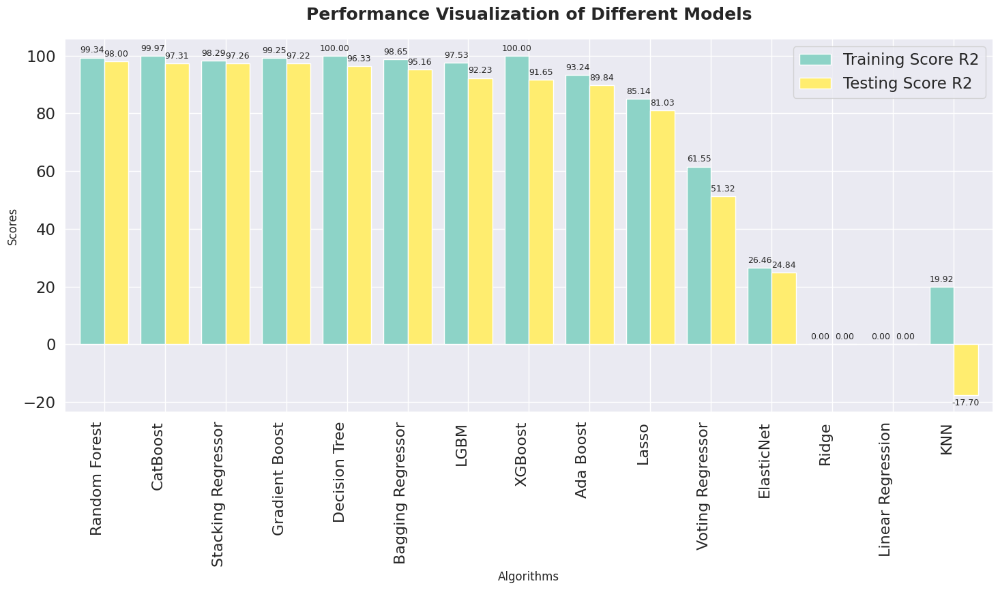

In [93]:
# Plotting bar chart for training and testing scores
ax = df_model_sort.plot(
    x="Algorithms",
    y=["Training Score R2","Testing Score R2"],
    kind="bar",
    figsize=(15, 9),
    colormap="Set3",
    width=0.8
)

# Adding title and labels
plt.title("Performance Visualization of Different Models", fontsize=18, fontweight="bold", pad=20)
plt.xlabel("Algorithms", fontsize=12)
plt.ylabel("Scores", fontsize=12)
plt.xticks(rotation=90, ha='right', fontsize=16)

# Adding data labels to each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', fontsize=9, padding=3)

plt.tight_layout()
plt.show()

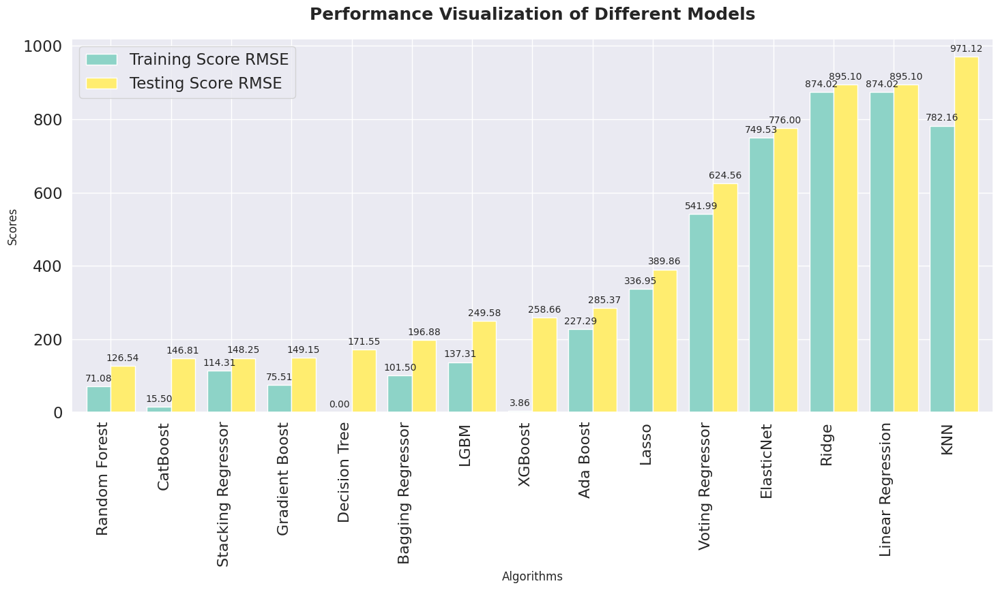

In [94]:
# Plotting bar chart for training and testing scores
ax = df_model_sort.plot(
    x="Algorithms",
    y=["Training Score RMSE","Testing Score RMSE"],
    kind="bar",
    figsize=(15, 9),
    colormap="Set3",
    width=0.8
)

# Adding title and labels
plt.title("Performance Visualization of Different Models", fontsize=18, fontweight="bold", pad=20)
plt.xlabel("Algorithms", fontsize=12)
plt.ylabel("Scores", fontsize=12)
plt.xticks(rotation=90, ha='right', fontsize=16)

# Adding data labels to each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', fontsize=10, padding=3)

plt.tight_layout()
plt.show()

In [95]:
df_with_eda = df.copy()

In [96]:
df_with_eda.head()

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,6637.0,4685,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,796.0,22,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,19656.0,126905000,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,1739.0,794,2051.4,165500.63,539.09,0.420909


from matplotlib import pyplot as plt
_df_68['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_69['Production'].plot(kind='hist', bins=20, title='Production')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_70['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_71['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_72.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_73.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_74.plot(kind='scatter', x='Area', y='Production', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_75.plot(kind='scatter', x='Production', y='Fertilizer', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_76.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_77.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_78.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Area']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_79.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Area')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_80.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Production']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_81.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Production')

from matplotlib import pyplot as plt
_df_82['Area'].plot(kind='line', figsize=(8, 4), title='Area')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_83['Production'].plot(kind='line', figsize=(8, 4), title='Production')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_84['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_85['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_86.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_87['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_87, x='Area', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_88['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_88, x='Area', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_89['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_89, x='Production', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_90['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_90, x='Production', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [97]:
# Drop 'Area' and 'Production' columns
df_with_eda = df_with_eda.drop(['Area', 'Production'], axis=1)

In [98]:
# Check skewness for each column
skewness = df_with_eda[['Annual_Rainfall','Fertilizer','Pesticide']].skew().sort_values()
skewness

,0
Annual_Rainfall,2.131785
Fertilizer,13.412599
Pesticide,25.635746


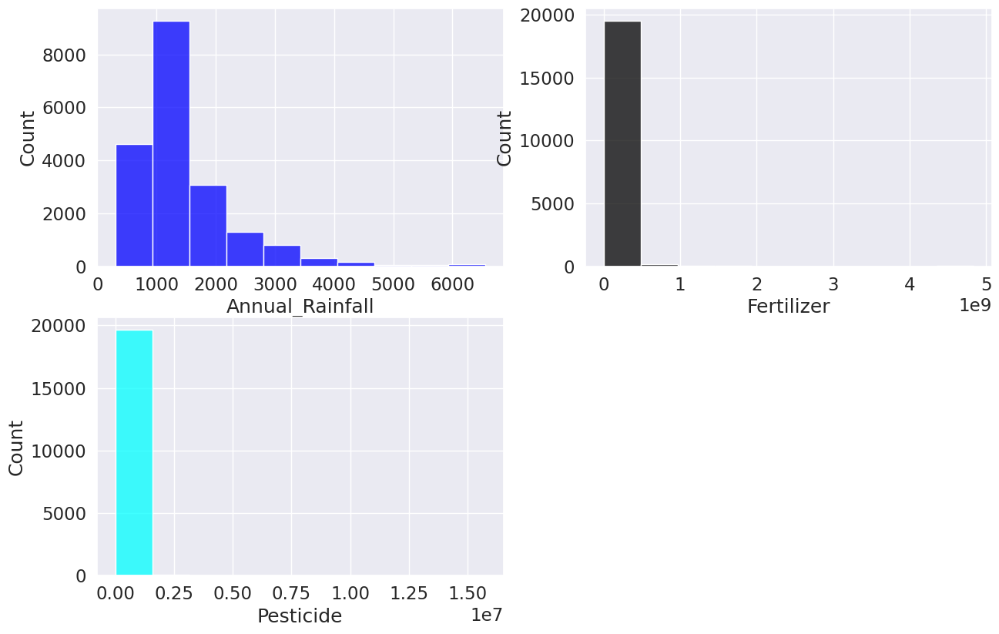

In [102]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
data = pd.read_csv('/crop_yieldss.csv')

# Extract numeric columns from the dataset
numeric_data = data.select_dtypes(include=['number'])

# Now plot the distribution of the numeric columns
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.histplot(numeric_data['Annual_Rainfall'], bins=10, color='blue')
plt.subplot(4, 2, 2)
sns.histplot(numeric_data['Fertilizer'], bins=10, color='black')
plt.subplot(4, 2, 3)
sns.histplot(numeric_data['Pesticide'], bins=10, color='cyan')

plt.show()


In [103]:
df_with_eda.head()

,Crop,Crop_Year,Season,State,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,2051.4,631643.29,2057.47,0.710435
2,Castor Seed,1997,Kharif,Assam,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(Lint),1997,Kharif,Assam,2051.4,165500.63,539.09,0.420909


from matplotlib import pyplot as plt
_df_91['Fertilizer'].plot(kind='hist', bins=20, title='Fertilizer')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_92['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_93['Yield'].plot(kind='hist', bins=20, title='Yield')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_94.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_95.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_96.plot(kind='scatter', x='Fertilizer', y='Pesticide', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_97.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Fertilizer']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_98.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Fertilizer')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Fertilizer']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_99.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Fertilizer')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_100.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Crop_Year']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_101.sort_values('Crop_Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Crop_Year')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
_df_102['Fertilizer'].plot(kind='line', figsize=(8, 4), title='Fertilizer')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_103['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_104['Yield'].plot(kind='line', figsize=(8, 4), title='Yield')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_105.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_106['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_106, x='Fertilizer', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_107['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_107, x='Fertilizer', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_108['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_108, x='Pesticide', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_109['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_109, x='Pesticide', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [104]:
exclude_column = ['Crop','Crop_Year','Season','State','Yield']

In [105]:
vif_columns = [col for col in df_with_eda.columns if col not in exclude_column]

In [106]:
vif1 = df_with_eda[vif_columns].copy()

In [107]:
variable = vif1
vif = pd.DataFrame()
vif['Variance Inflation Factor'] = [variance_inflation_factor(variable, i) for i in range(variable.shape[1])]
vif['Features'] = vif_columns

In [108]:
vif.sort_values(by="Variance Inflation Factor", ascending=False)

,Variance Inflation Factor,Features
1,12.000198,Fertilizer
2,11.946021,Pesticide
0,1.027439,Annual_Rainfall


from matplotlib import pyplot as plt
_df_110['Variance Inflation Factor'].plot(kind='hist', bins=20, title='Variance Inflation Factor')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_111.groupby('Features').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_112['Variance Inflation Factor'].plot(kind='line', figsize=(8, 4), title='Variance Inflation Factor')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_113['Features'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_113, x='Variance Inflation Factor', y='Features', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [109]:
vif2 = vif1.copy()

In [110]:
vif2.drop(['Fertilizer'], axis = 1, inplace=True)

In [111]:
exclude_column = ['Crop','Crop_Year','Season','State','Yield','Area']

In [112]:
vif_columns = [col for col in vif2.columns if col not in exclude_column]

In [113]:
variable = vif2
vif = pd.DataFrame()
vif['Variance Inflation Factor'] = [variance_inflation_factor(variable, i) for i in range(variable.shape[1])]
vif['Features'] = vif_columns

In [114]:
vif.sort_values(by="Variance Inflation Factor", ascending=False)

,Variance Inflation Factor,Features
1,1.022112,Pesticide
0,1.022112,Annual_Rainfall


from matplotlib import pyplot as plt
_df_114['Variance Inflation Factor'].plot(kind='hist', bins=20, title='Variance Inflation Factor')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_115.groupby('Features').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_116['Variance Inflation Factor'].plot(kind='line', figsize=(8, 4), title='Variance Inflation Factor')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_117['Features'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_117, x='Variance Inflation Factor', y='Features', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [115]:
df_with_eda_encoding = df_with_eda.copy()
df_with_eda_encoding = df_with_eda_encoding.drop(['Crop_Year'], axis = 1)

In [116]:
df_with_eda_encoding = df_with_eda_encoding.drop(['Fertilizer'], axis = 1)

In [117]:
df_with_eda_encoding.head()

,Crop,Season,State,Annual_Rainfall,Pesticide,Yield
0,Arecanut,Whole Year,Assam,2051.4,22882.34,0.796087
1,Arhar/Tur,Kharif,Assam,2051.4,2057.47,0.710435
2,Castor Seed,Kharif,Assam,2051.4,246.76,0.238333
3,Coconut,Whole Year,Assam,2051.4,6093.36,5238.051739
4,Cotton(Lint),Kharif,Assam,2051.4,539.09,0.420909


from matplotlib import pyplot as plt
_df_118['Pesticide'].plot(kind='hist', bins=20, title='Pesticide')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_119['Yield'].plot(kind='hist', bins=20, title='Yield')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_120.groupby('Crop').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_121.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_122.plot(kind='scatter', x='Pesticide', y='Yield', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Annual_Rainfall']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_123.sort_values('Annual_Rainfall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Annual_Rainfall')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Annual_Rainfall']
  ys = series['Pesticide']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_124.sort_values('Annual_Rainfall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Annual_Rainfall')
_ = plt.ylabel('Pesticide')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Annual_Rainfall']
  ys = series['Yield']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_125.sort_values('Annual_Rainfall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Crop')):
  _plot_series(series, series_name, i)
  fig.legend(title='Crop', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Annual_Rainfall')
_ = plt.ylabel('Yield')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Annual_Rainfall']
  ys = series['Yield']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_126.sort_values('Annual_Rainfall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Season')):
  _plot_series(series, series_name, i)
  fig.legend(title='Season', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Annual_Rainfall')
_ = plt.ylabel('Yield')

from matplotlib import pyplot as plt
_df_127['Pesticide'].plot(kind='line', figsize=(8, 4), title='Pesticide')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_128['Yield'].plot(kind='line', figsize=(8, 4), title='Yield')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in _df_129.groupby('Crop')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Crop')
_ = plt.ylabel('Season')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_130['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_130, x='Pesticide', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_131['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_131, x='Pesticide', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_132['Crop'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_132, x='Yield', y='Crop', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_133['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_133, x='Yield', y='Season', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [118]:
category_columns = df_with_eda_encoding.select_dtypes(include = ['object']).columns
category_columns

Index(['Crop', 'Season', 'State'], dtype='object')

In [119]:
df_with_eda_encoding = pd.get_dummies(df_with_eda_encoding, columns = category_columns, drop_first=True)

In [120]:
boolean_cols_auto = df_with_eda_encoding.select_dtypes(include=['bool']).columns
df_with_eda_encoding[boolean_cols_auto] = df_with_eda_encoding[boolean_cols_auto].astype(int)

In [121]:
df_with_eda_encoding.head()

,Annual_Rainfall,Pesticide,Yield,Crop_Arhar/Tur,Crop_Bajra,Crop_Banana,Crop_Barley,Crop_Black Pepper,Crop_Cardamom,Crop_Cashewnut,Crop_Castor Seed,Crop_Coconut,Crop_Coriander,Crop_Cotton(Lint),Crop_Cowpea(Lobia),Crop_Dry Chillies,Crop_Garlic,Crop_Ginger,Crop_Gram,Crop_Groundnut,Crop_Guar Seed,Crop_Horse-Gram,Crop_Jowar,Crop_Jute,Crop_Khesari,Crop_Linseed,Crop_Maize,Crop_Masoor,Crop_Mesta,Crop_Moong(Green Gram),Crop_Moth,Crop_Niger Seed,Crop_Oilseeds Total,Crop_Onion,Crop_Other Rabi Pulses,Crop_Other Cereals,Crop_Other Kharif Pulses,Crop_Other Oilseeds,Crop_Other Summer Pulses,Crop_Peas & Beans (Pulses),Crop_Potato,Crop_Ragi,Crop_Rapeseed &Mustard,Crop_Rice,Crop_Safflower,Crop_Sannhamp,Crop_Sesamum,Crop_Small Millets,Crop_Soyabean,Crop_Sugarcane,Crop_Sunflower,Crop_Sweet Potato,Crop_Tapioca,Crop_Tobacco,Crop_Turmeric,Crop_Urad,Crop_Wheat,Season_Kharif,Season_Rabi,Season_Summer,Season_Whole Year,Season_Winter,State_Arunachal Pradesh,State_Assam,State_Bihar,State_Chhattisgarh,State_Delhi,State_Goa,State_Gujarat,State_Haryana,State_Himachal Pradesh,State_Jammu And Kashmir,State_Jharkhand,State_Karnataka,State_Kerala,State_Madhya Pradesh,State_Maharashtra,State_Manipur,State_Meghalaya,State_Mizoram,State_Nagaland,State_Odisha,State_Puducherry,State_Punjab,State_Sikkim,State_Tamil Nadu,State_Telangana,State_Tripura,State_Uttar Pradesh,State_Uttarakhand,State_West Bengal
0,2051.4,22882.34,0.796087,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2051.4,2057.47,0.710435,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2051.4,246.76,0.238333,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2051.4,6093.36,5238.051739,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2051.4,539.09,0.420909,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [122]:
x = df_with_eda_encoding.drop(['Yield'], axis = 1)
y = df_with_eda_encoding['Yield']

In [123]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [124]:
print("x_train - >  ",x_train.shape)
print("y_train - >  ",y_train.shape)
print("x_test  - >  ",x_test.shape)
print("y_test  - >  ",y_test.shape)

x_train - >   (15751, 90)
y_train - >   (15751,)
x_test  - >   (3938, 90)
y_test  - >   (3938,)


In [125]:
pt = PowerTransformer(method='yeo-johnson')

In [126]:
x_train_scaled = pt.fit_transform(x_train)
x_test_scaled = pt.transform(x_test)

In [127]:
training_scores_r2 = []
training_scores_adj_r2 = []
training_scores_rmse = []

testing_scores_r2 = []
testing_scores_adj_r2 = []
testing_scores_rmse = []

In [128]:
def evaluate_model_performance(model, x_train, y_train, x_test, y_test):
    """
    Evaluates R², Adjusted R², and RMSE of a given model on training and testing data.

    Parameters:
    - model: The machine learning model to evaluate
    - x_train: Training feature set
    - y_train: Training target values
    - x_test: Testing feature set
    - y_test: Testing target values
    - training_scores: List to store training R² scores
    - testing_scores: List to store testing R² scores
    """
    # Fit the model
    model.fit(x_train, y_train)

    # Predictions for training and testing data
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    # Calculate R² scores
    train_r2 = r2_score(y_train, y_train_pred) * 100
    test_r2 = r2_score(y_test, y_test_pred) * 100

    # Calculate Adjusted R² scores
    n_train, p_train = x_train.shape
    n_test, p_test = x_test.shape
    train_adj_r2 = 100 * (1 - (1 - train_r2 / 100) * (n_train - 1) / (n_train - p_train - 1))
    test_adj_r2 = 100 * (1 - (1 - test_r2 / 100) * (n_test - 1) / (n_test - p_test - 1))

    # Calculate RMSE scores
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

    # Append scores to respective lists
    training_scores_r2.append(train_r2)
    training_scores_adj_r2.append(train_adj_r2)
    training_scores_rmse.append(train_rmse)
    testing_scores_r2.append(test_r2)
    testing_scores_adj_r2.append(test_adj_r2)
    testing_scores_rmse.append(test_rmse)

    # Display scores
    print(f"{model.__class__.__name__} Performance Metrics:")
    print(f"Training Data: R² = {train_r2:.2f}%, Adjusted R² = {train_adj_r2:.2f}%, RMSE = {train_rmse:.4f}")
    print(f"Testing Data : R² = {test_r2:.2f}%, Adjusted R² = {test_adj_r2:.2f}%, RMSE = {test_rmse:.4f}\n")

In [129]:
evaluate_model_performance(
    model=LinearRegression(),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

LinearRegression Performance Metrics:
Training Data: R² = 85.14%, Adjusted R² = 85.05%, RMSE = 336.9755
Testing Data : R² = 81.04%, Adjusted R² = 80.60%, RMSE = 389.7136



In [130]:
# Create the Ridge Regression model
ridge_regressor = Ridge(
    alpha=1.0,                  # Regularization strength
    fit_intercept=True,         # Whether to calculate the intercept (bias) term
    copy_X=True,                # If True, it makes a copy of the input matrix X
    max_iter=None,              # Maximum number of iterations for the solver
    tol=0.001,                  # Tolerance for stopping criteria
    solver='auto',              # Solver to use ('auto', 'lsqr', 'saga', etc.)
    random_state=None,          # Random state for reproducibility
    positive=False              # If True, coefficients are constrained to be positive
)

In [131]:
evaluate_model_performance(
    model=ridge_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)


Ridge Performance Metrics:
Training Data: R² = 85.14%, Adjusted R² = 85.05%, RMSE = 336.9755
Testing Data : R² = 81.04%, Adjusted R² = 80.60%, RMSE = 389.7149



In [132]:
# Create the Lasso Regression model
lasso_regressor = Lasso(
    alpha=1.0,                  # Regularization strength
    fit_intercept=True,         # Whether to calculate the intercept (bias) term
    copy_X=True,                # If True, it makes a copy of the input matrix X
    max_iter=1000,              # Maximum number of iterations for the solver
    tol=0.0001,                 # Tolerance for stopping criteria
    random_state=None,          # Random state for reproducibility
    positive=False              # If True, coefficients are constrained to be positive
)

In [133]:
evaluate_model_performance(
    model=lasso_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)


Lasso Performance Metrics:
Training Data: R² = 85.12%, Adjusted R² = 85.03%, RMSE = 337.1741
Testing Data : R² = 80.99%, Adjusted R² = 80.54%, RMSE = 390.2861



In [134]:
# Create the ElasticNet Regression model
elasticnet_regressor = ElasticNet(
    alpha=1.0,                  # Regularization strength
    l1_ratio=0.5,               # The balance between Lasso (L1) and Ridge (L2) regularization (0 is Ridge, 1 is Lasso)
    fit_intercept=True,         # Whether to calculate the intercept (bias) term
    copy_X=True,                # If True, it makes a copy of the input matrix X
    max_iter=1000,              # Maximum number of iterations for the solver
    tol=0.0001,                 # Tolerance for stopping criteria
    random_state=None,          # Random state for reproducibility
    positive=False              # If True, coefficients are constrained to be positive
)

In [135]:
evaluate_model_performance(
    model=elasticnet_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)


ElasticNet Performance Metrics:
Training Data: R² = 75.83%, Adjusted R² = 75.70%, RMSE = 429.6528
Testing Data : R² = 71.74%, Adjusted R² = 71.08%, RMSE = 475.8118



In [136]:
# Create the DecisionTree Regressor model
decision_tree_regressor = DecisionTreeRegressor(
    criterion='squared_error',    # Updated to 'squared_error' for mean squared error
    splitter='best',              # Strategy used to split at each node
    max_depth=None,               # Maximum depth of the tree
    min_samples_split=2,          # Minimum number of samples required to split an internal node
    min_samples_leaf=1,           # Minimum number of samples required to be at a leaf node
    max_features=None,            # The number of features to consider when looking for the best split
    random_state=42,              # Controls the randomness for reproducibility
    max_leaf_nodes=None,          # Grow a tree with a maximum number of leaf nodes
    min_impurity_decrease=0.0,    # Minimum impurity decrease required to make a further split
    ccp_alpha=0.0                # Complexity parameter used for Minimal Cost-Complexity Pruning
)

In [137]:
evaluate_model_performance(
    model=decision_tree_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

DecisionTreeRegressor Performance Metrics:
Training Data: R² = 100.00%, Adjusted R² = 100.00%, RMSE = 0.0019
Testing Data : R² = 94.16%, Adjusted R² = 94.02%, RMSE = 216.3124



In [138]:
# Create the RandomForest Regressor model
random_forest_regressor = RandomForestRegressor(
    criterion='squared_error',    # Updated to 'squared_error' for mean squared error
    n_estimators=100,             # Number of trees in the forest
    max_depth=None,               # Maximum depth of the tree
    min_samples_split=2,          # Minimum number of samples required to split an internal node
    min_samples_leaf=1,           # Minimum number of samples required to be at a leaf node
    max_features='sqrt',          # Use square root of features for the best split
    random_state=42,              # Controls the randomness for reproducibility
    n_jobs=-1,                    # Use all available cores for parallel processing
    max_samples=None,             # If bootstrap=True, the number of samples to draw from X to train each base estimator
)

In [139]:
evaluate_model_performance(
    model=random_forest_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

RandomForestRegressor Performance Metrics:
Training Data: R² = 99.44%, Adjusted R² = 99.44%, RMSE = 65.3675
Testing Data : R² = 95.36%, Adjusted R² = 95.25%, RMSE = 192.7621



In [140]:
evaluate_model_performance(
    model=AdaBoostRegressor(),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

AdaBoostRegressor Performance Metrics:
Training Data: R² = 93.54%, Adjusted R² = 93.50%, RMSE = 222.1375
Testing Data : R² = 87.95%, Adjusted R² = 87.67%, RMSE = 310.7227



In [141]:
evaluate_model_performance(
    model=GradientBoostingRegressor(),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

GradientBoostingRegressor Performance Metrics:
Training Data: R² = 98.99%, Adjusted R² = 98.99%, RMSE = 87.7234
Testing Data : R² = 96.80%, Adjusted R² = 96.73%, RMSE = 160.0155



In [142]:
evaluate_model_performance(
    model=LGBMRegressor(),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 770
[LightGBM] [Info] Number of data points in the train set: 15751, number of used features: 89
[LightGBM] [Info] Start training from score 80.138340
LGBMRegressor Performance Metrics:
Training Data: R² = 96.66%, Adjusted R² = 96.64%, RMSE = 159.7901
Testing Data : R² = 92.28%, Adjusted R² = 92.09%, RMSE = 248.7862



In [143]:
evaluate_model_performance(
    model=XGBRegressor(),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

XGBRegressor Performance Metrics:
Training Data: R² = 99.96%, Adjusted R² = 99.96%, RMSE = 18.3421
Testing Data : R² = 93.04%, Adjusted R² = 92.87%, RMSE = 236.1972



In [144]:
evaluate_model_performance(
    model=CatBoostRegressor(verbose=False),
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

CatBoostRegressor Performance Metrics:
Training Data: R² = 99.88%, Adjusted R² = 99.88%, RMSE = 30.3811
Testing Data : R² = 96.69%, Adjusted R² = 96.62%, RMSE = 162.7860



In [145]:
from sklearn.neighbors import KNeighborsRegressor

In [146]:
# Create the KNeighbors Regressor model
knn_regressor = KNeighborsRegressor(
    n_neighbors=5,               # Number of neighbors to use
    weights='uniform',           # Weight function: 'uniform' or 'distance'
    algorithm='auto',            # Algorithm used to compute the nearest neighbors
    leaf_size=30,                # Leaf size for tree-based algorithms
    metric='minkowski',          # The distance metric: 'minkowski', 'euclidean', etc.
    p=2,                         # Power parameter for the Minkowski metric (2 for Euclidean distance)
    n_jobs=-1                    # Use all available cores for parallel processing
)

In [147]:
evaluate_model_performance(
    model=knn_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

KNeighborsRegressor Performance Metrics:
Training Data: R² = 97.31%, Adjusted R² = 97.30%, RMSE = 143.2184
Testing Data : R² = 96.71%, Adjusted R² = 96.63%, RMSE = 162.3969



In [148]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [149]:
# Define base models
model1 = LinearRegression()
model2 = RandomForestRegressor(n_estimators=100, random_state=42)
model3 = KNeighborsRegressor()

In [150]:
# Combine models in a Voting Regressor
voting_regressor = VotingRegressor(estimators=[('lr', model1),('rf', model2),('knn', model3)])

In [151]:
evaluate_model_performance(
    model = voting_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

VotingRegressor Performance Metrics:
Training Data: R² = 96.88%, Adjusted R² = 96.86%, RMSE = 154.3138
Testing Data : R² = 95.25%, Adjusted R² = 95.14%, RMSE = 195.0462



In [152]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

In [153]:
# Initialize the base regressor (e.g., Decision Tree Regressor)
base_regressor = DecisionTreeRegressor(random_state=42)

In [154]:
# Create the Bagging Regressor
bagging_regressor = BaggingRegressor(
    estimator=base_regressor,  # Updated parameter name
    n_estimators=50,           # Number of base estimators
    max_samples=0.8,           # Fraction of samples to use for each base estimator
    max_features=0.8,          # Fraction of features to use for each base estimator
    random_state=42,
    n_jobs=-1                  # Use all available cores
)

In [155]:
evaluate_model_performance(
    model = bagging_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

BaggingRegressor Performance Metrics:
Training Data: R² = 98.79%, Adjusted R² = 98.79%, RMSE = 96.0110
Testing Data : R² = 95.33%, Adjusted R² = 95.22%, RMSE = 193.3874



In [161]:
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [162]:
# Define base models (level-0)
base_models = [
    ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
    ('rf', RandomForestRegressor(n_estimators=50, random_state=42))
]

In [163]:
# Define the meta-model (level-1)
meta_model = KNeighborsRegressor()

In [164]:
# Create the Stacking Regressor
stacking_regressor = StackingRegressor(
    estimators=base_models,  # Base models
    final_estimator=meta_model,  # Meta-model
    n_jobs=-1               # Use all available cores
)

In [165]:
evaluate_model_performance(
    model = stacking_regressor,
    x_train=x_train_scaled,
    y_train=y_train,
    x_test=x_test_scaled,
    y_test=y_test
)

StackingRegressor Performance Metrics:
Training Data: R² = 98.03%, Adjusted R² = 98.02%, RMSE = 122.6044
Testing Data : R² = 97.55%, Adjusted R² = 97.49%, RMSE = 140.0959



In [166]:
models = [
    "Linear Regression",
    "Ridge",
    "Lasso",
    "ElasticNet",
    "Decision Tree",
    "Random Forest",
    "Ada Boost",
    "Gradient Boost",
    "LGBM",
    "XGBoost",
    "CatBoost",
    "KNN",
    "Voting Regressor",
    "Bagging Regressor",
    "Stacking Regressor"]

In [168]:
print(len(models))
print(len(training_scores_r2))
print(len(training_scores_adj_r2))
print(len(training_scores_rmse))
print(len(testing_scores_r2))
print(len(testing_scores_adj_r2))
print(len(testing_scores_rmse))


15
16
16
16
16
16
16


In [169]:
# Example data for models and scores (ensure lengths match)
models = ['Model1', 'Model2', 'Model3']  # Length = 3
training_scores_r2 = [0.85, 0.90, 0.88]  # Length = 3
training_scores_adj_r2 = [0.83, 0.88, 0.86]  # Length = 3
training_scores_rmse = [0.12, 0.10, 0.11]  # Length = 3
testing_scores_r2 = [0.80, 0.87, 0.85]  # Length = 3
testing_scores_adj_r2 = [0.78, 0.85, 0.83]  # Length = 3
testing_scores_rmse = [0.14, 0.11, 0.12]  # Length = 3

# Create the DataFrame
df_model = pd.DataFrame({
    "Algorithms": models,
    "Training Score R2": training_scores_r2,
    "Training Score Adjusted R2": training_scores_adj_r2,
    "Training Score RMSE": training_scores_rmse,
    "Testing Score R2": testing_scores_r2,
    "Testing Score Adjusted R2": testing_scores_adj_r2,
    "Testing Score RMSE": testing_scores_rmse,
})

# Sort by Testing Score R2
df_model_sort = df_model.sort_values(by="Testing Score R2", ascending=False)
df_model_sort


,Algorithms,Training Score R2,Training Score Adjusted R2,Training Score RMSE,Testing Score R2,Testing Score Adjusted R2,Testing Score RMSE
1,Model2,0.90,0.88,0.10,0.87,0.85,0.11
2,Model3,0.88,0.86,0.11,0.85,0.83,0.12
0,Model1,0.85,0.83,0.12,0.80,0.78,0.14


from matplotlib import pyplot as plt
_df_134['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_135['Training Score R2'].plot(kind='hist', bins=20, title='Training Score R2')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_136['Training Score Adjusted R2'].plot(kind='hist', bins=20, title='Training Score Adjusted R2')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_137['Training Score RMSE'].plot(kind='hist', bins=20, title='Training Score RMSE')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_138.groupby('Algorithms').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_139.plot(kind='scatter', x='index', y='Training Score R2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_140.plot(kind='scatter', x='Training Score R2', y='Training Score Adjusted R2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_141.plot(kind='scatter', x='Training Score Adjusted R2', y='Training Score RMSE', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_142.plot(kind='scatter', x='Training Score RMSE', y='Testing Score R2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Training Score RMSE']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_143.sort_values('Training Score RMSE', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Algorithms')):
  _plot_series(series, series_name, i)
  fig.legend(title='Algorithms', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Training Score RMSE')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Training Score RMSE']
  ys = series['Training Score R2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_144.sort_values('Training Score RMSE', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Algorithms')):
  _plot_series(series, series_name, i)
  fig.legend(title='Algorithms', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Training Score RMSE')
_ = plt.ylabel('Training Score R2')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Training Score RMSE']
  ys = series['Training Score Adjusted R2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_145.sort_values('Training Score RMSE', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Algorithms')):
  _plot_series(series, series_name, i)
  fig.legend(title='Algorithms', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Training Score RMSE')
_ = plt.ylabel('Training Score Adjusted R2')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Training Score RMSE']
  ys = series['Testing Score R2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_146.sort_values('Training Score RMSE', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Algorithms')):
  _plot_series(series, series_name, i)
  fig.legend(title='Algorithms', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Training Score RMSE')
_ = plt.ylabel('Testing Score R2')

from matplotlib import pyplot as plt
_df_147['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_148['Training Score R2'].plot(kind='line', figsize=(8, 4), title='Training Score R2')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_149['Training Score Adjusted R2'].plot(kind='line', figsize=(8, 4), title='Training Score Adjusted R2')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_150['Training Score RMSE'].plot(kind='line', figsize=(8, 4), title='Training Score RMSE')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_151['Algorithms'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_151, x='index', y='Algorithms', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_152['Algorithms'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_152, x='Training Score R2', y='Algorithms', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_153['Algorithms'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_153, x='Training Score Adjusted R2', y='Algorithms', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_154['Algorithms'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_154, x='Training Score RMSE', y='Algorithms', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [172]:
df_model = pd.DataFrame(
        {"Algorithms":models,
         "Training Score R2":training_scores_r2,
         "Training Score Adjusted R2":training_scores_adj_r2,
         "Training Score RMSE":training_scores_rmse,
         "Testing Score R2":testing_scores_r2,
         "Testing Score Adjusted R2":testing_scores_adj_r2,
         "Testing Score RMSE":testing_scores_rmse,
        })

df_model_sort = df_model.sort_values(by="Testing Score R2", ascending=False)
df_model_sort

,Algorithms,Training Score R2,Training Score Adjusted R2,Training Score RMSE,Testing Score R2,Testing Score Adjusted R2,Testing Score RMSE
1,Model2,0.90,0.88,0.10,0.87,0.85,0.11
2,Model3,0.88,0.86,0.11,0.85,0.83,0.12
0,Model1,0.85,0.83,0.12,0.80,0.78,0.14


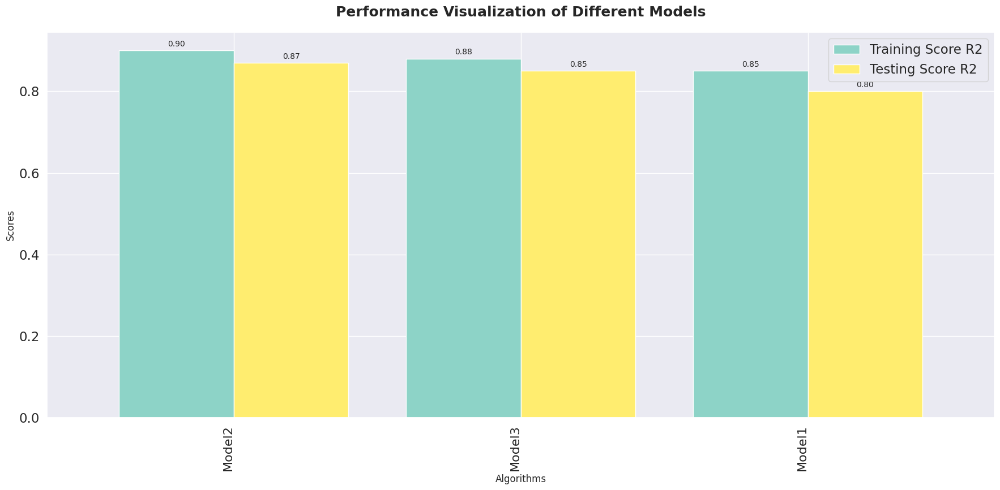

In [170]:
# Plotting bar chart for training and testing scores
ax = df_model_sort.plot(
    x="Algorithms",
    y=["Training Score R2","Testing Score R2"],
    kind="bar",
    figsize=(18, 9),
    colormap="Set3",
    width=0.8
)

# Adding title and labels
plt.title("Performance Visualization of Different Models", fontsize=18, fontweight="bold", pad=20)
plt.xlabel("Algorithms", fontsize=12)
plt.ylabel("Scores", fontsize=12)
plt.xticks(rotation=90, ha='right', fontsize=16)

# Adding data labels to each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', fontsize=10, padding=3)

plt.tight_layout()
plt.show()

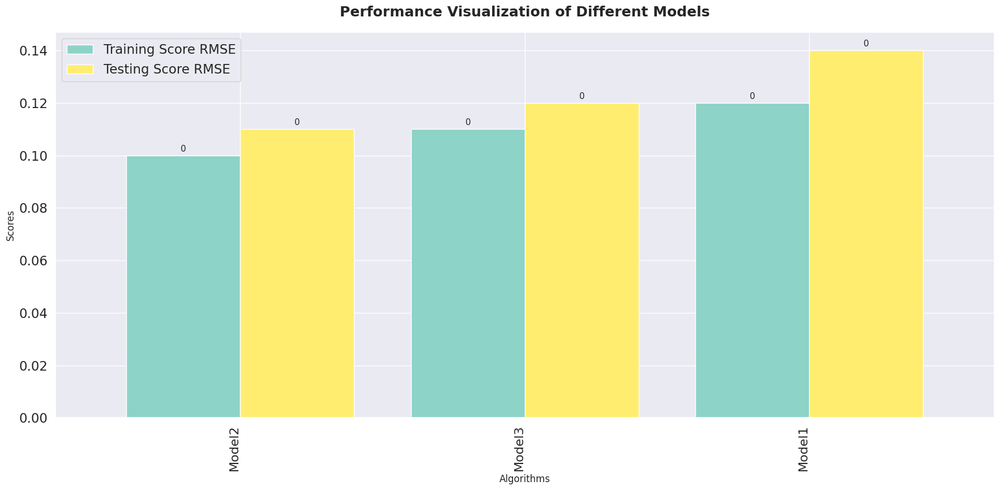

In [171]:
# Plotting bar chart for training and testing scores
ax = df_model_sort.plot(
    x="Algorithms",
    y=["Training Score RMSE","Testing Score RMSE"],
    kind="bar",
    figsize=(18, 9),
    colormap="Set3",
    width=0.8
)

# Adding title and labels
plt.title("Performance Visualization of Different Models", fontsize=18, fontweight="bold", pad=20)
plt.xlabel("Algorithms", fontsize=12)
plt.ylabel("Scores", fontsize=12)
plt.xticks(rotation=90, ha='right', fontsize=16)

# Adding data labels to each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', label_type='edge', fontsize=11, padding=3)

plt.tight_layout()
plt.show()
